# Problem Statement

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

# Objective

- To predict the churn in the last month (i.e. the ninth) using the data (features) from the first three months
- To identify important predictor attributes which help the business understand indicators of churn
- To recommend strategies to manage customer churn based on your observations

## Step by Step Approach

- Step 1: Reading and understanding the dataset
- Step 2: Data Cleansing (Handling missing values, Data cleaning for rows)
- Step 3: Filtering High Value Customers using 6th and 7th month data (good phase)
- Step 4: Derive Churn using 9th month data (churn pahase)
- Step 5: Drop 9th month data (churn pahase)
- Step 6: Data Preparation (Deriving Variables, EDA, Outlier Treatment, Handling class imbalance, Splitting the data into Train and Test, Scaling)
- Step 7: Model Building (Building 1 Interpretable Model without PCA and 3 High Performance Model with PCA)
- Step 8: Model Evaluation (Confusion Matrix, Accuracy Score, Precision, Recall and F1 Score)

## Importing Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option('display.max_columns', None) # to see all the columns
pd.set_option('display.max_rows', None) # to see all the rows

import warnings
warnings.filterwarnings('ignore')

#### Step 1: Reading and understanding the dataset

In [2]:
tel_churn = pd.read_csv('telecom_churn_data.csv')
tel_churn.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [3]:
tel_churn.shape

(99999, 226)

In [4]:
tel_churn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


In [5]:
tel_churn.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.0,96140.0,94621.0,92254.0,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621

In [6]:
tel_churn.columns[tel_churn.dtypes=='object']

Index(['last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8',
       'last_date_of_month_9', 'date_of_last_rech_6', 'date_of_last_rech_7',
       'date_of_last_rech_8', 'date_of_last_rech_9',
       'date_of_last_rech_data_6', 'date_of_last_rech_data_7',
       'date_of_last_rech_data_8', 'date_of_last_rech_data_9'],
      dtype='object')

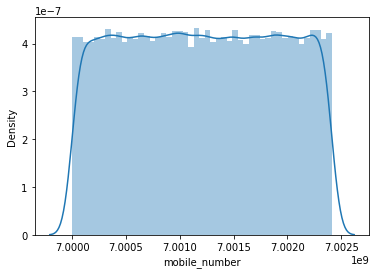

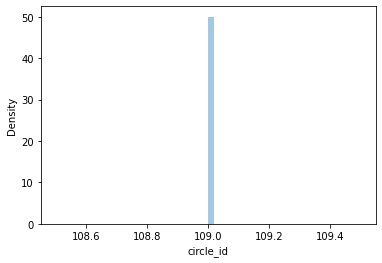

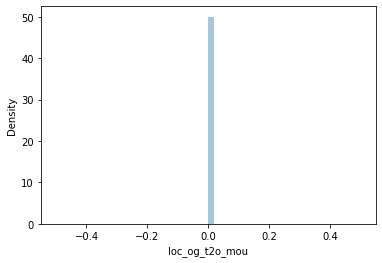

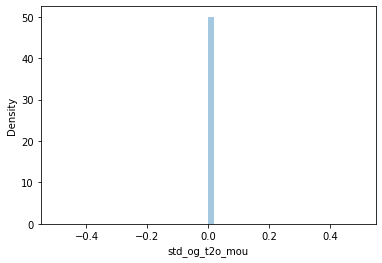

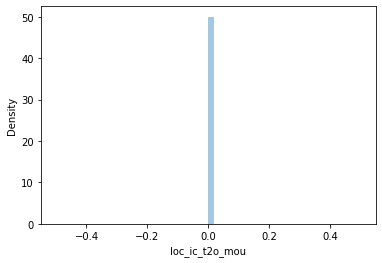

...

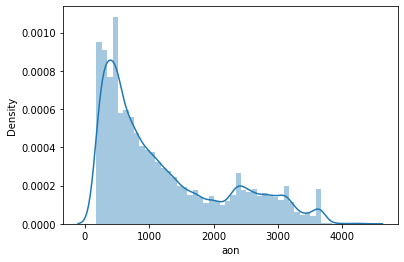

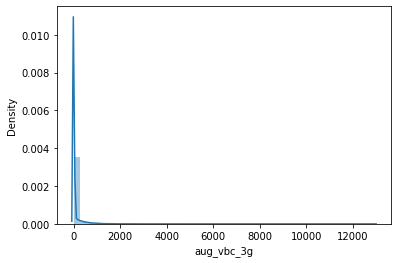

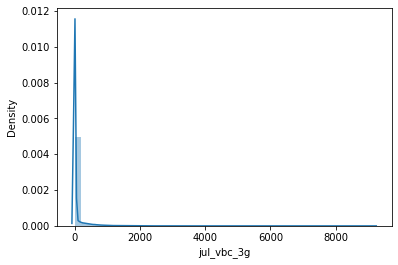

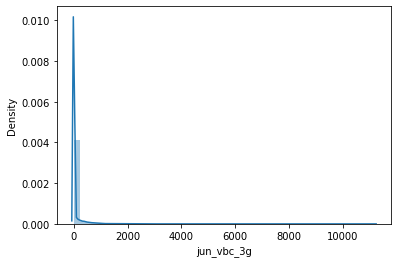

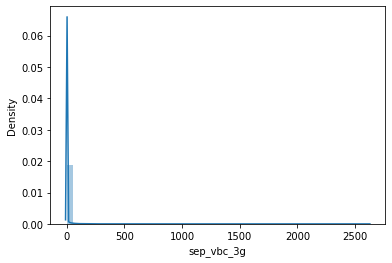

In [7]:
for i in tel_churn.describe().columns:
    sns.distplot(tel_churn[i])
    plt.show()

Observation: The data for most of the variables are right skewed

#### Step 2: Data Cleansing (Handling missing values, Data cleaning for rows and Outlier Treatment)

In [8]:
#find out missing values in all columns
tel_churn.isnull().sum().sort_values(ascending=False)


arpu_3g_6                   74846
night_pck_user_6            74846
total_rech_data_6           74846
arpu_2g_6                   74846
max_rech_data_6             74846
fb_user_6                   74846
av_rech_amt_data_6          74846
date_of_last_rech_data_6    74846
count_rech_2g_6             74846
count_rech_3g_6             74846
date_of_last_rech_data_7    74428
total_rech_data_7           74428
fb_user_7                   74428
max_rech_data_7             74428
night_pck_user_7            74428
count_rech_2g_7             74428
av_rech_amt_data_7          74428
arpu_2g_7                   74428
count_rech_3g_7             74428
arpu_3g_7                   74428
total_rech_data_9           74077
count_rech_3g_9             74077
fb_user_9                   74077
max_rech_data_9             74077
arpu_3g_9                   74077
date_of_last_rech_data_9    74077
night_pck_user_9            74077
arpu_2g_9                   74077
count_rech_2g_9             74077
av_rech_amt_da

Observation: We have a missing values for most of the columns

In [9]:
#Find columns which are having more than 50% missing values
fifty_perc_rows=len(tel_churn)/2
drop_col_50_perc=tel_churn.columns[tel_churn.isna().sum()>fifty_perc_rows]
drop_col_50_perc

Index(['date_of_last_rech_data_6', 'date_of_last_rech_data_7',
       'date_of_last_rech_data_8', 'date_of_last_rech_data_9',
       'total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8',
       'total_rech_data_9', 'max_rech_data_6', 'max_rech_data_7',
       'max_rech_data_8', 'max_rech_data_9', 'count_rech_2g_6',
       'count_rech_2g_7', 'count_rech_2g_8', 'count_rech_2g_9',
       'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8',
       'count_rech_3g_9', 'av_rech_amt_data_6', 'av_rech_amt_data_7',
       'av_rech_amt_data_8', 'av_rech_amt_data_9', 'arpu_3g_6', 'arpu_3g_7',
       'arpu_3g_8', 'arpu_3g_9', 'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8',
       'arpu_2g_9', 'night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8',
       'night_pck_user_9', 'fb_user_6', 'fb_user_7', 'fb_user_8', 'fb_user_9'],
      dtype='object')

In [10]:
#drop columns which are having more than 50% missing values
tel_churn.drop(drop_col_50_perc,axis=1,inplace=True)
tel_churn.shape

(99999, 186)

In [11]:
tel_churn.isnull().sum().sort_values(ascending=False)

loc_og_t2m_mou_9        7745
loc_ic_t2m_mou_9        7745
offnet_mou_9            7745
std_ic_t2f_mou_9        7745
roam_ic_mou_9           7745
std_og_t2t_mou_9        7745
roam_og_mou_9           7745
std_ic_t2m_mou_9        7745
loc_og_t2t_mou_9        7745
std_ic_t2o_mou_9        7745
loc_og_mou_9            7745
std_ic_t2t_mou_9        7745
isd_og_mou_9            7745
loc_ic_t2f_mou_9        7745
loc_og_t2c_mou_9        7745
loc_og_t2f_mou_9        7745
loc_ic_t2t_mou_9        7745
std_og_t2m_mou_9        7745
spl_ic_mou_9            7745
std_ic_mou_9            7745
ic_others_9             7745
std_og_mou_9            7745
isd_ic_mou_9            7745
spl_og_mou_9            7745
onnet_mou_9             7745
std_og_t2c_mou_9        7745
loc_ic_mou_9            7745
og_others_9             7745
std_og_t2f_mou_9        7745
std_og_t2t_mou_8        5378
std_og_t2c_mou_8        5378
loc_ic_t2m_mou_8        5378
loc_ic_t2f_mou_8        5378
og_others_8             5378
std_og_t2m_mou

In [12]:
#Find missing values count for rows
missing_values_rows=tel_churn.isnull().sum(axis=1)
missing_values_rows

0         87
1          0
2          0
3          0
4          0
5          0
6          0
7         29
8          0
9          0
10        29
11         1
12         0
13         0
14         0
15        29
16         0
17         0
18         0
19         0
20         0
21         0
22         0
23         0
24         0
25         0
26        30
27         0
28         0
29        29
30         0
31         0
32        29
33         0
34         0
35        87
36         0
37        29
38         0
39         0
40         0
41         0
42         0
43         0
44         0
45        87
46         0
47         0
48         0
49         0
50         0
51        30
52         1
53         0
54         0
55         0
56         0
57         0
58         0
59         0
60         0
61         0
62         0
63         0
64         0
65         0
66         0
67        31
68        59
69         0
70         0
71         0
72         1
73         0
74         0
75         0
76         0

In [13]:
missing_perc_rows=missing_values_rows/186*100
missing_perc_rows

0        46.774194
1         0.000000
2         0.000000
3         0.000000
4         0.000000
5         0.000000
6         0.000000
7        15.591398
8         0.000000
9         0.000000
10       15.591398
11        0.537634
12        0.000000
13        0.000000
14        0.000000
15       15.591398
16        0.000000
17        0.000000
18        0.000000
19        0.000000
20        0.000000
21        0.000000
22        0.000000
23        0.000000
24        0.000000
25        0.000000
26       16.129032
27        0.000000
28        0.000000
29       15.591398
30        0.000000
31        0.000000
32       15.591398
33        0.000000
34        0.000000
35       46.774194
36        0.000000
37       15.591398
38        0.000000
39        0.000000
40        0.000000
41        0.000000
42        0.000000
43        0.000000
44        0.000000
45       46.774194
46        0.000000
47        0.000000
48        0.000000
49        0.000000
50        0.000000
51       16.129032
52        0.

In [14]:
#Drop the rows which are having more than 50% missing values
tel_churn=tel_churn[missing_perc_rows<50]
tel_churn.shape

(98716, 186)

In [15]:
tel_churn.columns[tel_churn.dtypes=='object']

Index(['last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8',
       'last_date_of_month_9', 'date_of_last_rech_6', 'date_of_last_rech_7',
       'date_of_last_rech_8', 'date_of_last_rech_9'],
      dtype='object')

In [16]:
#Drop all the date columns
date_cols=tel_churn.columns[tel_churn.dtypes=='object']
tel_churn.drop(date_cols,axis=1,inplace=True)
tel_churn.shape

(98716, 178)

In [17]:
tel_churn.isna().sum().sort_values(ascending=False)

spl_og_mou_9          6462
loc_og_t2t_mou_9      6462
std_og_t2f_mou_9      6462
loc_ic_mou_9          6462
loc_ic_t2m_mou_9      6462
roam_og_mou_9         6462
std_ic_t2f_mou_9      6462
std_og_t2m_mou_9      6462
std_ic_t2m_mou_9      6462
loc_ic_t2t_mou_9      6462
loc_ic_t2f_mou_9      6462
loc_og_t2m_mou_9      6462
std_og_t2t_mou_9      6462
loc_og_t2f_mou_9      6462
std_ic_t2t_mou_9      6462
loc_og_mou_9          6462
std_ic_t2o_mou_9      6462
roam_ic_mou_9         6462
offnet_mou_9          6462
std_og_mou_9          6462
ic_others_9           6462
isd_og_mou_9          6462
isd_ic_mou_9          6462
og_others_9           6462
spl_ic_mou_9          6462
loc_og_t2c_mou_9      6462
onnet_mou_9           6462
std_ic_mou_9          6462
std_og_t2c_mou_9      6462
std_og_mou_8          4096
std_og_t2m_mou_8      4096
loc_ic_t2t_mou_8      4096
std_og_t2c_mou_8      4096
og_others_8           4096
loc_ic_t2m_mou_8      4096
std_og_t2t_mou_8      4096
loc_ic_mou_8          4096
i

In [18]:
#Find columns which are having less than 3000 missing values0
impute_cols_zero=tel_churn.columns[(tel_churn.isna().sum()<3000) & (tel_churn.isna().sum()>0)]
impute_cols_zero

Index(['onnet_mou_6', 'onnet_mou_7', 'offnet_mou_6', 'offnet_mou_7',
       'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_og_mou_6', 'roam_og_mou_7',
       'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2m_mou_6',
       'loc_og_t2m_mou_7', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7',
       'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_mou_6', 'loc_og_mou_7',
       'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2m_mou_6',
       'std_og_t2m_mou_7', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7',
       'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_mou_6', 'std_og_mou_7',
       'isd_og_mou_6', 'isd_og_mou_7', 'spl_og_mou_6', 'spl_og_mou_7',
       'og_others_6', 'og_others_7', 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7',
       'loc_ic_t2m_mou_6', 'loc_ic_t2m_mou_7', 'loc_ic_t2f_mou_6',
       'loc_ic_t2f_mou_7', 'loc_ic_mou_6', 'loc_ic_mou_7', 'std_ic_t2t_mou_6',
       'std_ic_t2t_mou_7', 'std_ic_t2m_mou_6', 'std_ic_t2m_mou_7',
       'std_ic_t2f_mou_6', 'std_ic_t2f_mou_7', 'std_ic_t2o_mou_6',
  

In [19]:
#Impute columns with less than 3000 missing values with 0
tel_churn[impute_cols_zero]=tel_churn[impute_cols_zero].fillna(value=0)
tel_churn.isna().sum().sort_values(ascending=False)

loc_og_t2f_mou_9      6462
roam_og_mou_9         6462
loc_og_t2t_mou_9      6462
spl_ic_mou_9          6462
loc_og_t2m_mou_9      6462
loc_ic_t2f_mou_9      6462
loc_og_t2c_mou_9      6462
loc_ic_t2m_mou_9      6462
loc_og_mou_9          6462
isd_ic_mou_9          6462
std_og_t2t_mou_9      6462
loc_ic_t2t_mou_9      6462
std_og_t2m_mou_9      6462
std_og_t2f_mou_9      6462
ic_others_9           6462
std_og_t2c_mou_9      6462
std_og_mou_9          6462
og_others_9           6462
isd_og_mou_9          6462
loc_ic_mou_9          6462
spl_og_mou_9          6462
offnet_mou_9          6462
roam_ic_mou_9         6462
std_ic_t2m_mou_9      6462
std_ic_t2o_mou_9      6462
std_ic_t2t_mou_9      6462
std_ic_mou_9          6462
onnet_mou_9           6462
std_ic_t2f_mou_9      6462
ic_others_8           4096
onnet_mou_8           4096
std_og_t2m_mou_8      4096
loc_ic_t2t_mou_8      4096
std_og_t2f_mou_8      4096
std_ic_t2f_mou_8      4096
std_ic_t2t_mou_8      4096
std_og_t2c_mou_8      4096
s

##### Outlier Analysis

In [20]:
col=tel_churn.columns
col

Index(['mobile_number', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou',
       'loc_ic_t2o_mou', 'arpu_6', 'arpu_7', 'arpu_8', 'arpu_9', 'onnet_mou_6',
       ...
       'monthly_3g_9', 'sachet_3g_6', 'sachet_3g_7', 'sachet_3g_8',
       'sachet_3g_9', 'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g',
       'sep_vbc_3g'],
      dtype='object', length=178)

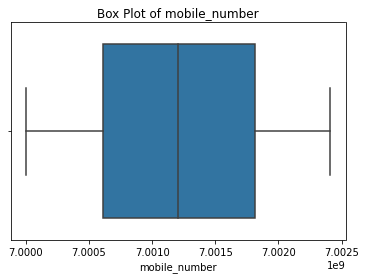

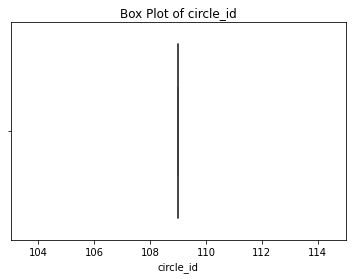

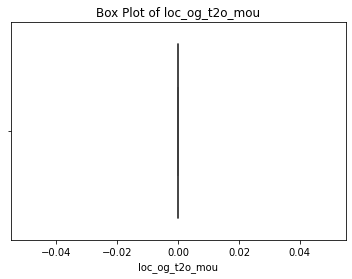

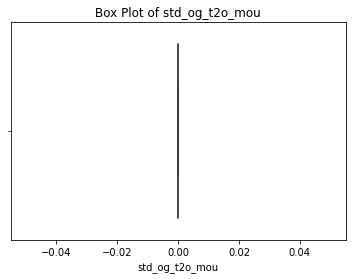

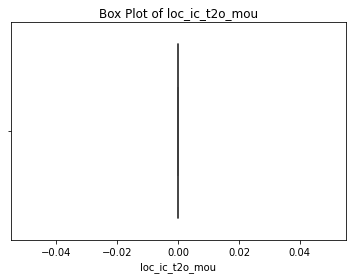

...

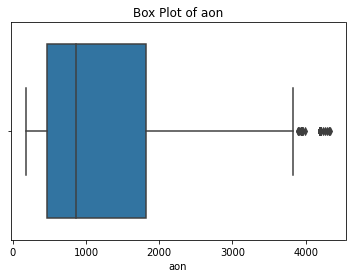

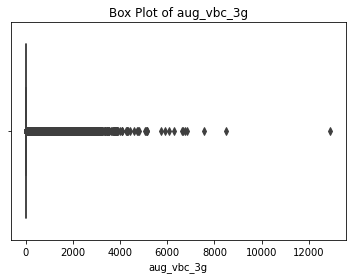

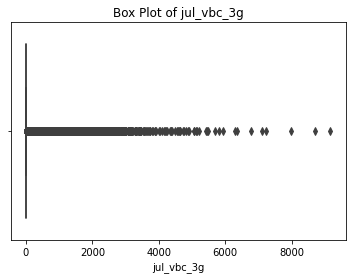

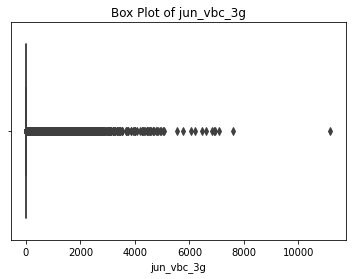

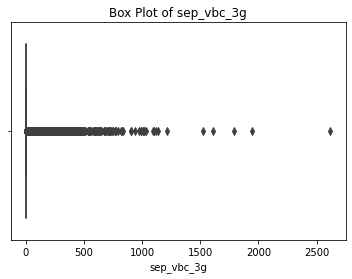

In [21]:
for i in col:
    sns.boxplot(tel_churn[i])
    plt.title('Box Plot of '+i)
    plt.show()

Observation: Almost all the variables are having outliers. We will be using Soft Capping, Hard Capping and IQR to treat the Outliers

In [22]:
tel_churn.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.871600e+04,98716.0,98716.0,98716.0,98716.0,98716.000000,98716.000000,98716.000000,98716.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.0,98716.0,94620.0,92254.0,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,98716.000000,98716.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.0,98716.0,94620.0,92254.0,98716.0

In [23]:
# Drop the columns with single value.
single_value_columns=['circle_id','loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou',
                      'std_og_t2c_mou_6','std_og_t2c_mou_7','std_og_t2c_mou_8','std_og_t2c_mou_9',
                     'std_ic_t2o_mou_6','std_ic_t2o_mou_7','std_ic_t2o_mou_8','std_ic_t2o_mou_9']
tel_churn.drop(single_value_columns,axis=1,inplace=True)
tel_churn.shape

(98716, 166)

In [24]:
col=tel_churn.columns.drop(['mobile_number'])
col

Index(['arpu_6', 'arpu_7', 'arpu_8', 'arpu_9', 'onnet_mou_6', 'onnet_mou_7',
       'onnet_mou_8', 'onnet_mou_9', 'offnet_mou_6', 'offnet_mou_7',
       ...
       'monthly_3g_9', 'sachet_3g_6', 'sachet_3g_7', 'sachet_3g_8',
       'sachet_3g_9', 'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g',
       'sep_vbc_3g'],
      dtype='object', length=165)

In [25]:
hard_cap_col=['roam_ic_mou_6','roam_ic_mou_7','roam_ic_mou_8','roam_ic_mou_9',
             'loc_og_t2c_mou_6','loc_og_t2c_mou_7','loc_og_t2c_mou_8','loc_og_t2c_mou_9',
             'std_og_t2f_mou_6','std_og_t2f_mou_7','std_og_t2f_mou_8','std_og_t2f_mou_9',
             'isd_og_mou_6','isd_og_mou_7','isd_og_mou_8','isd_og_mou_9',
             'og_others_6','og_others_7','og_others_8','og_others_9',
             'std_ic_t2f_mou_6','std_ic_t2f_mou_7','std_ic_t2f_mou_8','std_ic_t2f_mou_9',
             'spl_ic_mou_6','spl_ic_mou_7','spl_ic_mou_8','spl_ic_mou_9',
             'isd_ic_mou_6','isd_ic_mou_7','isd_ic_mou_8','isd_ic_mou_9',
             'ic_others_6','ic_others_7','ic_others_8','ic_others_9',
             'vol_2g_mb_6','vol_2g_mb_7','vol_2g_mb_8','vol_2g_mb_9',
             'vol_3g_mb_6','vol_3g_mb_7','vol_3g_mb_8','vol_3g_mb_9',
             'aug_vbc_3g','jul_vbc_3g','jun_vbc_3g','sep_vbc_3g']

In [26]:
soft_cap_col=['monthly_2g_6','monthly_2g_7','monthly_2g_8','monthly_2g_9','sachet_2g_6','sachet_2g_7','sachet_2g_8','sachet_2g_9',
             'monthly_3g_6','monthly_3g_7','monthly_3g_8','monthly_3g_9','sachet_3g_6','sachet_3g_7','sachet_3g_8','sachet_3g_9',
             'aon',]
soft_cap_col

['monthly_2g_6',
 'monthly_2g_7',
 'monthly_2g_8',
 'monthly_2g_9',
 'sachet_2g_6',
 'sachet_2g_7',
 'sachet_2g_8',
 'sachet_2g_9',
 'monthly_3g_6',
 'monthly_3g_7',
 'monthly_3g_8',
 'monthly_3g_9',
 'sachet_3g_6',
 'sachet_3g_7',
 'sachet_3g_8',
 'sachet_3g_9',
 'aon']

In [27]:
IQR_col=col.drop(soft_cap_col)
IQR_col=IQR_col.drop(hard_cap_col)
IQR_col

Index(['arpu_6', 'arpu_7', 'arpu_8', 'arpu_9', 'onnet_mou_6', 'onnet_mou_7',
       'onnet_mou_8', 'onnet_mou_9', 'offnet_mou_6', 'offnet_mou_7',
       'offnet_mou_8', 'offnet_mou_9', 'roam_og_mou_6', 'roam_og_mou_7',
       'roam_og_mou_8', 'roam_og_mou_9', 'loc_og_t2t_mou_6',
       'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2t_mou_9',
       'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8',
       'loc_og_t2m_mou_9', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7',
       'loc_og_t2f_mou_8', 'loc_og_t2f_mou_9', 'loc_og_mou_6', 'loc_og_mou_7',
       'loc_og_mou_8', 'loc_og_mou_9', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7',
       'std_og_t2t_mou_8', 'std_og_t2t_mou_9', 'std_og_t2m_mou_6',
       'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2m_mou_9',
       'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'std_og_mou_9',
       'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'spl_og_mou_9',
       'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'total_og_mou_9',
      

In [28]:
#Replace all the outliers in IQR_col with whisker values
for i in IQR_col:
    q1=tel_churn[i].quantile(0.25)
    q3=tel_churn[i].quantile(0.75)
    IQR=q3-q1
    lower=q1-1.5*IQR
    upper=q3+1.5*IQR
    tel_churn[i][tel_churn[i]<lower]=lower
    tel_churn[i][tel_churn[i]>upper]=upper
    

In [29]:
#apply soft capping on soft cap columns
for i in soft_cap_col:
    q1=tel_churn[i].quantile(0.01)
    q2=tel_churn[i].quantile(0.99)
    tel_churn[i][tel_churn[i]<q1]=q1
    tel_churn[i][tel_churn[i]>q2]=q2

In [30]:
#apply hard capping on hard cap columns
for i in hard_cap_col:
    q1=tel_churn[i].quantile(0.05)
    q2=tel_churn[i].quantile(0.95)
    tel_churn[i][tel_churn[i]<q1]=q1
    tel_churn[i][tel_churn[i]>q2]=q2

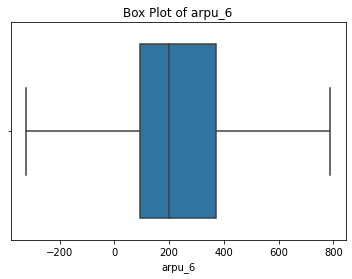

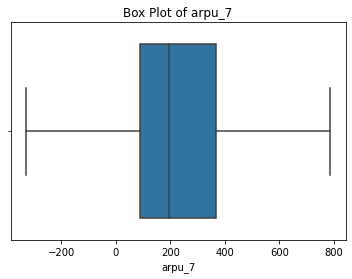

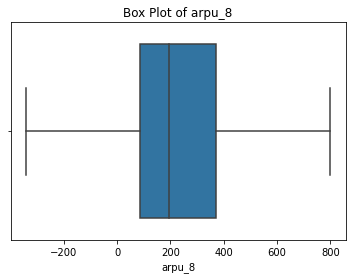

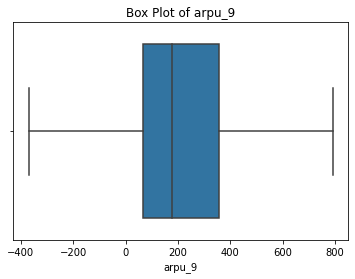

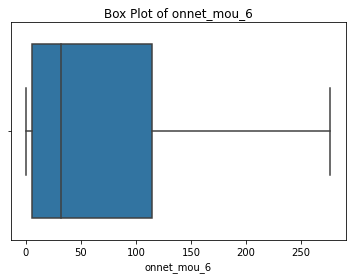

...

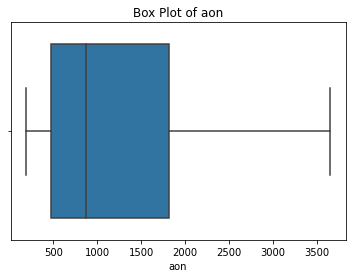

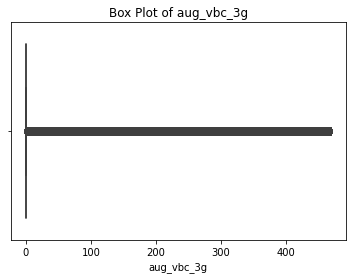

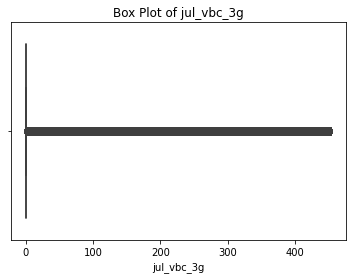

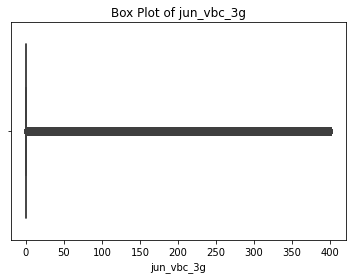

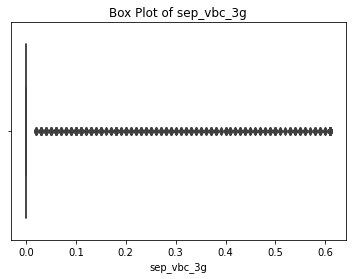

In [31]:
for i in col:
    sns.boxplot(tel_churn[i])
    plt.title('Box Plot of '+i)
    plt.show()

Observation: Outliers are removed for almost all the variables after the treatment

In [32]:
tel_churn.describe()

,mobile_number,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.871600e+04,98716.000000,98716.000000,98716.000000,98716.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.00000,94620.000000,92254.00000,98716.000000,98716.000000,94620.000000,92254.000000,98716.0,98716.0,94620.0,92254.0,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.0,98716.0,94620.0,92254.0,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.0,94620.0,92254.0,98716.000000,98716.000000,98716.000000,98716.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,98716.000000,98716.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,94620.000000,92254.000000,98716.000000,98716.000000,98716.000000,98716.000000,98716.000000,98716.000000,98716.000000,

In [33]:
# Drop Columns with only 0s after outlier treatment
zero_col=['roam_og_mou_6','roam_og_mou_7','roam_og_mou_8','roam_og_mou_9',
         'isd_og_mou_6','isd_og_mou_7','isd_og_mou_8','isd_og_mou_9',
         'og_others_7','og_others_8','og_others_9']
tel_churn.drop(zero_col,axis=1,inplace=True)
tel_churn.shape

(98716, 155)

In [34]:
tel_churn.isna().sum().sort_values(ascending=False).head(60)

loc_ic_mou_9        6462
std_og_t2f_mou_9    6462
loc_og_t2c_mou_9    6462
loc_og_mou_9        6462
std_ic_t2t_mou_9    6462
loc_og_t2f_mou_9    6462
std_og_t2t_mou_9    6462
loc_og_t2m_mou_9    6462
std_og_t2m_mou_9    6462
loc_ic_t2f_mou_9    6462
std_ic_t2m_mou_9    6462
loc_og_t2t_mou_9    6462
roam_ic_mou_9       6462
isd_ic_mou_9        6462
ic_others_9         6462
offnet_mou_9        6462
spl_ic_mou_9        6462
std_og_mou_9        6462
loc_ic_t2m_mou_9    6462
loc_ic_t2t_mou_9    6462
onnet_mou_9         6462
std_ic_t2f_mou_9    6462
std_ic_mou_9        6462
spl_og_mou_9        6462
std_og_t2t_mou_8    4096
loc_ic_t2t_mou_8    4096
loc_ic_mou_8        4096
std_og_mou_8        4096
std_og_t2m_mou_8    4096
loc_ic_t2m_mou_8    4096
loc_ic_t2f_mou_8    4096
std_og_t2f_mou_8    4096
loc_og_mou_8        4096
spl_og_mou_8        4096
loc_og_t2c_mou_8    4096
roam_ic_mou_8       4096
offnet_mou_8        4096
isd_ic_mou_8        4096
onnet_mou_8         4096
std_ic_mou_8        4096


In [35]:
#Impute remaining missing values with mean or median
simple_impute_col=tel_churn.columns[tel_churn.isna().sum()>0]
simple_impute_col

Index(['onnet_mou_8', 'onnet_mou_9', 'offnet_mou_8', 'offnet_mou_9',
       'roam_ic_mou_8', 'roam_ic_mou_9', 'loc_og_t2t_mou_8',
       'loc_og_t2t_mou_9', 'loc_og_t2m_mou_8', 'loc_og_t2m_mou_9',
       'loc_og_t2f_mou_8', 'loc_og_t2f_mou_9', 'loc_og_t2c_mou_8',
       'loc_og_t2c_mou_9', 'loc_og_mou_8', 'loc_og_mou_9', 'std_og_t2t_mou_8',
       'std_og_t2t_mou_9', 'std_og_t2m_mou_8', 'std_og_t2m_mou_9',
       'std_og_t2f_mou_8', 'std_og_t2f_mou_9', 'std_og_mou_8', 'std_og_mou_9',
       'spl_og_mou_8', 'spl_og_mou_9', 'loc_ic_t2t_mou_8', 'loc_ic_t2t_mou_9',
       'loc_ic_t2m_mou_8', 'loc_ic_t2m_mou_9', 'loc_ic_t2f_mou_8',
       'loc_ic_t2f_mou_9', 'loc_ic_mou_8', 'loc_ic_mou_9', 'std_ic_t2t_mou_8',
       'std_ic_t2t_mou_9', 'std_ic_t2m_mou_8', 'std_ic_t2m_mou_9',
       'std_ic_t2f_mou_8', 'std_ic_t2f_mou_9', 'std_ic_mou_8', 'std_ic_mou_9',
       'spl_ic_mou_8', 'spl_ic_mou_9', 'isd_ic_mou_8', 'isd_ic_mou_9',
       'ic_others_8', 'ic_others_9'],
      dtype='object')

In [36]:
tel_churn[simple_impute_col].median()

onnet_mou_8         32.36
onnet_mou_9         29.84
offnet_mou_8        92.14
offnet_mou_9        87.29
roam_ic_mou_8        0.00
roam_ic_mou_9        0.00
loc_og_t2t_mou_8    11.73
loc_og_t2t_mou_9    11.26
loc_og_t2m_mou_8    40.36
loc_og_t2m_mou_9    39.12
loc_og_t2f_mou_8     0.00
loc_og_t2f_mou_9     0.00
loc_og_t2c_mou_8     0.00
loc_og_t2c_mou_9     0.00
loc_og_mou_8        63.73
loc_og_mou_9        61.84
std_og_t2t_mou_8     0.00
std_og_t2t_mou_9     0.00
std_og_t2m_mou_8     3.31
std_og_t2m_mou_9     2.50
std_og_t2f_mou_8     0.00
std_og_t2f_mou_9     0.00
std_og_mou_8        10.41
std_og_mou_9         8.41
spl_og_mou_8         0.00
spl_og_mou_9         0.00
loc_ic_t2t_mou_8    16.03
loc_ic_t2t_mou_9    15.66
loc_ic_t2m_mou_8    58.24
loc_ic_t2m_mou_9    56.61
loc_ic_t2f_mou_8     0.93
loc_ic_t2f_mou_9     0.96
loc_ic_mou_8        93.83
loc_ic_mou_9        91.64
std_ic_t2t_mou_8     0.00
std_ic_t2t_mou_9     0.00
std_ic_t2m_mou_8     2.03
std_ic_t2m_mou_9     1.74
std_ic_t2f_m

Note: Lets impute remaining missing values with median as almost all columns are highly skewed towards right

In [37]:
for i in simple_impute_col:
    Median=tel_churn[i].median()
    tel_churn[i].fillna(Median,inplace=True)

In [38]:
tel_churn.isna().sum().sort_values(ascending=False)

mobile_number         0
ic_others_6           0
spl_ic_mou_7          0
spl_ic_mou_8          0
spl_ic_mou_9          0
isd_ic_mou_6          0
isd_ic_mou_7          0
isd_ic_mou_8          0
isd_ic_mou_9          0
ic_others_7           0
total_rech_amt_8      0
ic_others_8           0
ic_others_9           0
total_rech_num_6      0
total_rech_num_7      0
total_rech_num_8      0
total_rech_num_9      0
total_rech_amt_6      0
spl_ic_mou_6          0
total_ic_mou_9        0
total_ic_mou_8        0
total_ic_mou_7        0
std_ic_t2t_mou_8      0
std_ic_t2t_mou_9      0
std_ic_t2m_mou_6      0
std_ic_t2m_mou_7      0
std_ic_t2m_mou_8      0
std_ic_t2m_mou_9      0
std_ic_t2f_mou_6      0
std_ic_t2f_mou_7      0
std_ic_t2f_mou_8      0
std_ic_t2f_mou_9      0
std_ic_mou_6          0
std_ic_mou_7          0
std_ic_mou_8          0
std_ic_mou_9          0
total_ic_mou_6        0
total_rech_amt_7      0
total_rech_amt_9      0
std_ic_t2t_mou_6      0
monthly_3g_9          0
sachet_2g_6     

Observation: All the missing values are treated and no missing values are left

#### Step 3: Filtering High Value Customers using 6th and 7th month data (good phase)

In [39]:
# create new column for average recharge of 6th and 7th month
tel_churn['Avg_rech_amt_6+7']=(tel_churn['total_rech_amt_6']+tel_churn['total_rech_amt_7'])/2
perc_70=tel_churn['Avg_rech_amt_6+7'].quantile(0.70)
perc_70

371.0

In [40]:
#filter High Value Customers based on 70th percentile of 'Avg_rech_amt_6+7'
HVC=tel_churn[(tel_churn['Avg_rech_amt_6+7'])>=perc_70]
HVC
HVC.shape

(29643, 156)

In [41]:
HVC=HVC.reset_index(drop=True)

In [42]:
HVC.head()

,mobile_number,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,Avg_rech_amt_6+7
0,7000701601,788.840,786.4325,799.778,500.000,57.8400,54.68,52.29,29.84,453.43,508.67125,325.91,87.29,16.23,21.995,24.461,0.00,51.39,31.380,40.28,11.26,255.63,249.33625,162.28,39.12,4.775,4.90,5.1,0.00,0.0,0.0,0.00,0.0,388.535,377.8675,255.79,61.84,4.30,23.29,12.01,0.000,49.89000,31.76,49.140,2.50,4.16,3.8,3.95,0.00,60.8600,75.14,77.8400,8.4100,4.50,0.00,6.500,0.00,0.00,487.53000,609.24,350.160,0.00,58.14,32.26,27.31,15.66,217.56,221.49,121.19,56.61,19.20,19.65,20.275,0.96,427.88,355.23,188.04,91.64,9.325,9.825,10.20,0.000,35.60,37.65,38.40,1.74,8.16,8.29,8.53,0.0,64.60,67.95,69.26,5.380,573.535,558.04,428.74000,0.00,0.21,0.0,0.0,0.0,2.060,14.5300,29.91,0.0000,2.0,2.5425,2.45,0.00,5,5,7,3,935,790,948,0.0,255,275,315,0,0,0,325,0,0.0,0.0000,0.00,0.0,0.0,0.00,0.00,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.0,862.5
1,7001524846,378.721,492.2230,137.362,166.787,276.7475,269.29,35.08,33.46,94.66,80.63000,136.48,108.71,0.00,0.000,0.000,0.00,96.69,94.505,12.49,26.13,80.96,70.58000,50.54,34.58,0.000,0.00,0.0,0.00,0.0,0.0,7.15,0.0,378.090,288.1800,63.04,60.71,69.65,70.90,22.58,7.330,13.69000,10.04,75.690,74.13,0.00,0.0,0.00,0.00,130.2600,143.48,98.2800,81.4600,0.00,0.00,9.975,0.00,0.00,508.36000,431.66,171.560,142.18,23.84,9.84,0.31,4.03,57.58,13.98,15.48,17.34,0.00,0.00,0.000,0.00,81.43,23.83,15.79,21.38,0.000,0.580,0.10,0.000,22.43,4.08,0.65,13.53,0.00,0.00,0.00,0.0,22.43,4.66,0.75,13.530,103.860,28.49,16.54000,34.91,0.00,0.0,0.0,0.0,0.000,0.0000,0.00,0.0000,0.0,0.0000,0.00,0.00,18,19,14,15,437,601,120,186.0,90,154,30,36,50,0,10,0,0.0,323.6825,0.03,0.0,0.0,750.95,11.94,0.0,0,1,0,0,0,1,3,0,0,0,0,0,0,0,0,0,315,21.03,452.80,122.16,0.0,519.0
2,7002191713,492.846,205.6710,593.260,322.732,276.7475,108.39,279

In [43]:
#drop 'Avg_rech_amt_6+7' column from new dataset
HVC.drop('Avg_rech_amt_6+7',axis=1,inplace=True)
HVC.shape

(29643, 155)

Observation: There are 29643 customers conisdered as High Value Customers

#### Step 4: Derive Churn using 9th month data (churn pahase)

In [44]:
# 1 indicated Churned and 0 indicates not churned
HVC['Churn']=0
HVC['Churn'][(HVC['total_ic_mou_9']==0) & (HVC['total_og_mou_9']==0) & (HVC['vol_2g_mb_9']==0) & (HVC['vol_3g_mb_9']==0)]=1
HVC.Churn

0        1
1        0
2        0
3        0
4        0
5        0
6        0
7        0
8        0
9        0
10       0
11       0
12       0
13       0
14       0
15       0
16       0
17       0
18       0
19       0
20       0
21       0
22       0
23       1
24       0
25       0
26       0
27       0
28       1
29       0
30       0
31       0
32       0
33       0
34       0
35       1
36       0
37       0
38       0
39       0
40       0
41       0
42       0
43       0
44       0
45       0
46       0
47       0
48       0
49       0
50       0
51       1
52       0
53       0
54       1
55       0
56       0
57       0
58       0
59       0
60       0
61       0
62       0
63       0
64       0
65       0
66       0
67       0
68       0
69       0
70       0
71       0
72       0
73       0
74       0
75       0
76       0
77       0
78       0
79       0
80       0
81       0
82       0
83       0
84       0
85       0
86       0
87       0
88       0
89       0
90       0

In [45]:
HVC.Churn.value_counts()

0    27133
1     2510
Name: Churn, dtype: int64

Observation: The non churn customers are turned out to be 27133 and churned would be 2510. So here there is a heavy class imbalance

#### Step 5: Drop 9th month data (churn pahase)

In [46]:
col=HVC.columns

In [47]:
for i in col:
    name=i.split('_')
    if name[-1]=='9':
        HVC.drop(i,axis=1,inplace=True)

In [48]:
HVC.shape

(29643, 119)

In [49]:
HVC.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,Churn
0,7000701601,788.840,786.4325,799.778,57.8400,54.68,52.29,453.43,508.67125,325.91,16.23,21.995,24.461,51.39,31.380,40.28,255.63,249.33625,162.28,4.775,4.90,5.1,0.0,0.0,0.00,388.535,377.8675,255.79,4.30,23.29,12.01,49.89000,31.76,49.140,4.16,3.8,3.95,60.8600,75.14,77.8400,4.50,0.00,6.500,0.00,487.53000,609.24,350.160,58.14,32.26,27.31,217.56,221.49,121.19,19.20,19.65,20.275,427.88,355.23,188.04,9.325,9.825,10.20,35.60,37.65,38.40,8.16,8.29,8.53,64.60,67.95,69.26,573.535,558.04,428.74000,0.21,0.0,0.0,2.060,14.5300,29.91,2.0,2.5425,2.45,5,5,7,935,790,948,255,275,315,0,0,325,0.0,0.0000,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.0,1
1,7001524846,378.721,492.2230,137.362,276.7475,269.29,35.08,94.66,80.63000,136.48,0.00,0.000,0.000,96.69,94.505,12.49,80.96,70.58000,50.54,0.000,0.00,0.0,0.0,0.0,7.15,378.090,288.1800,63.04,69.65,70.90,22.58,13.69000,10.04,75.690,0.00,0.0,0.00,130.2600,143.48,98.2800,0.00,0.00,9.975,0.00,508.36000,431.66,171.560,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.000,81.43,23.83,15.79,0.000,0.580,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,103.860,28.49,16.54000,0.00,0.0,0.0,0.000,0.0000,0.00,0.0,0.0000,0.00,18,19,14,437,601,120,90,154,30,50,0,10,0.0,323.6825,0.03,0.0,750.95,11.94,0,1,0,0,1,3,0,0,0,0,0,0,315,21.03,452.80,122.16,0.0,0
2,7002191713,492.846,205.6710,593.260,276.7475,108.39,279.96,413.31,119.28000,482.46,23.53,21.995,24.461,49.63,6.190,36.01,151.13,47.28000,258.01,4.540,0.00,5.1,0.0,0.0,0.49,205.310,53.4800,353.99,69.65,70.90,76.45,124.70625,52.94,131.225,0.00,0.0,0.00,338.7875,138.93,369.8625,0.00,0.00,4.780,0.00,872.77125,192.41,875.585,67.88,7.58,52.58,142.88,18.53,195.18,4.81,0.00,7.490,215.58,26.11,255.26,9.325,9.825,10.20,35.60,29.79,38.40,0.00,0.00,1.91,64.60,67.95,69.26,573.535,172.58,567.69375,0.41,0.0,0.0,23.835,27.8325,29.91,2.0,2.5425,2.45,6,4,11,507,253,717,110,110,130,110,50,0,0.0,0.0000,0.02,0.0,0.00,0.00,0,0,0,0,0,3,0,0,0,0,0,0,2607,0.00,0.00,0.00,0.0,0
3,7000875565,430.975,299.8690,187.894,50.5100,74.01,70.61,296.29,229.74000,162.76,0.00,2.830,0.000,42.61,65.160,67.38,255.63,145.99000,128.28,0.000,4.48,5.1,0.0,0.0,0.00,315.910,215.6400,205.93,7.89,2.58,3.23,22.99000,64.51,18.290,0.00,0.0,0.00,30.8900,67.09,21.5300,0.00,3.26,5.910,0.00,346.81000,286.01,233.380,41.33,71.44,28.

#### Step 6: Data Preparation (Deriving Variables, EDA, Handling class imbalance, Splitting the data into Train and Test, Scaling)

##### Deriving new variables

Note: We have selected the variables such as 'Recharge Amount', 'Data Volume based on usage of 2G and 3G' for derving the information pertaining Good Phase and Action Phase as these variables will be impacting the churn rate pretty much

In [50]:
HVC['Total_rech_amt_GoodPhase']=HVC['total_rech_amt_6']+HVC['total_rech_amt_7']
HVC['Total_data_volume_GoodPhase']=HVC['vol_2g_mb_6']+HVC['vol_2g_mb_7']+HVC['vol_3g_mb_6']+HVC['vol_3g_mb_7']
HVC['Total_data_volume_ActionPhase']=HVC['vol_2g_mb_8']+HVC['vol_3g_mb_8']
HVC.rename(columns={'total_rech_amt_8':'Total_rech_amt_ActionPhase'},inplace=True)
HVC.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,Total_rech_amt_ActionPhase,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,Churn,Total_rech_amt_GoodPhase,Total_data_volume_GoodPhase,Total_data_volume_ActionPhase
0,7000701601,788.840,786.4325,799.778,57.8400,54.68,52.29,453.43,508.67125,325.91,16.23,21.995,24.461,51.39,31.380,40.28,255.63,249.33625,162.28,4.775,4.90,5.1,0.0,0.0,0.00,388.535,377.8675,255.79,4.30,23.29,12.01,49.89000,31.76,49.140,4.16,3.8,3.95,60.8600,75.14,77.8400,4.50,0.00,6.500,0.00,487.53000,609.24,350.160,58.14,32.26,27.31,217.56,221.49,121.19,19.20,19.65,20.275,427.88,355.23,188.04,9.325,9.825,10.20,35.60,37.65,38.40,8.16,8.29,8.53,64.60,67.95,69.26,573.535,558.04,428.74000,0.21,0.0,0.0,2.060,14.5300,29.91,2.0,2.5425,2.45,5,5,7,935,790,948,255,275,315,0,0,325,0.0,0.0000,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.0,1,1725,0.0000,0.00
1,7001524846,378.721,492.2230,137.362,276.7475,269.29,35.08,94.66,80.63000,136.48,0.00,0.000,0.000,96.69,94.505,12.49,80.96,70.58000,50.54,0.000,0.00,0.0,0.0,0.0,7.15,378.090,288.1800,63.04,69.65,70.90,22.58,13.69000,10.04,75.690,0.00,0.0,0.00,130.2600,143.48,98.2800,0.00,0.00,9.975,0.00,508.36000,431.66,171.560,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.000,81.43,23.83,15.79,0.000,0.580,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,103.860,28.49,16.54000,0.00,0.0,0.0,0.000,0.0000,0.00,0.0,0.0000,0.00,18,19,14,437,601,120,90,154,30,50,0,10,0.0,323.6825,0.03,0.0,750.95,11.94,0,1,0,0,1,3,0,0,0,0,0,0,315,21.03,452.80,122.16,0.0,0,1038,1074.6325,11.97
2,7002191713,492.846,205.6710,593.260,276.7475,108.39,279.96,413.31,119.28000,482.46,23.53,21.995,24.461,49.63,6.190,36.01,151.13,47.28000,258.01,4.540,0.00,5.1,0.0,0.0,0.49,205.310,53.4800,353.99,69.65,70.90,76.45,124.70625,52.94,131.225,0.00,0.0,0.00,338.7875,138.93,369.8625,0.00,0.00,4.780,0.00,872.77125,192.41,875.585,67.88,7.58,52.58,142.88,18.53,195.18,4.81,0.00,7.490,215.58,26.11,255.26,9.325,9.825,10.20,35.60,29.79,38.40,0.00,0.00,1.91,64.60,67.95,69.26,573.535,172.58,567.69375,0.41,0.0,0.0,23.835,27.8325,29.91,2.0,2.5425,2.45,6,4,11,507,253,717,110,110,130,110,50,0,0.0,0.0000,0.02,0.0,0.00,0.00,0,0,0,0,0,3,0,0,0,0,0,0,2607,0.00,0.00,0.00,0.0,0,760,0.0000,0.02
3,7000875565,430.975,299.8690,187.894,50.5100,74.01,70.61,296.29,229.74000,162.76,0.00,2.830,0.000,42.61,65.160,67.38,255.63,145.99000,128.28,0.000,4.48,5.1,0.0,0.0,0.00,315.910,215

In [51]:
HVC.shape

(29643, 122)

Observation: There are 3 newly derived variables added along with the existing varaibles in the dataframe

##### EDA

In [52]:
#Drop mobile_number from HVC
HVC.drop('mobile_number',axis=1,inplace=True)

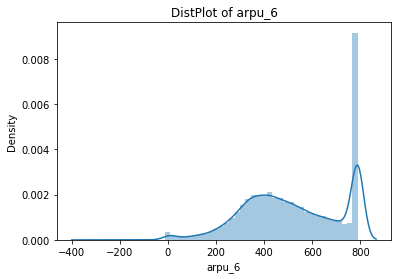

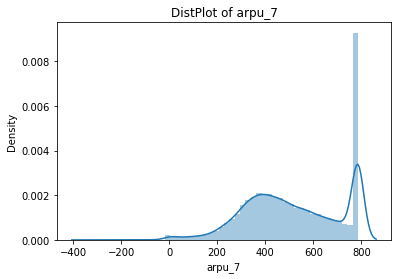

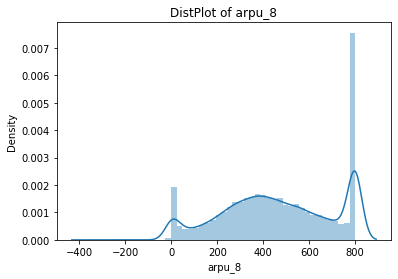

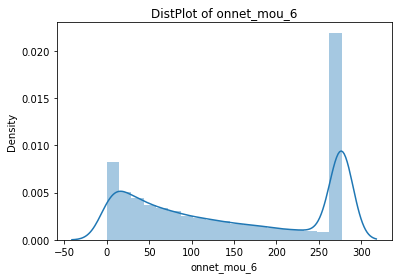

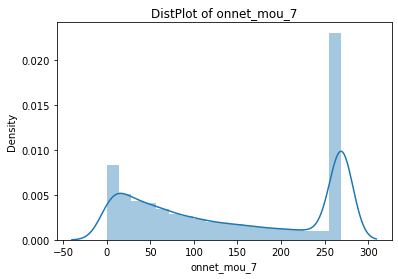

...

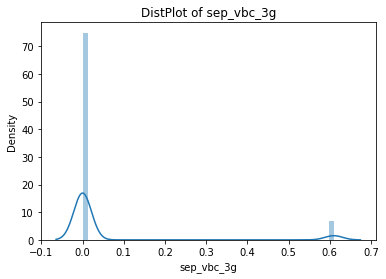

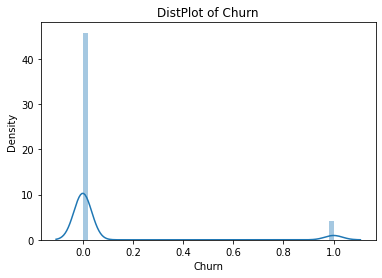

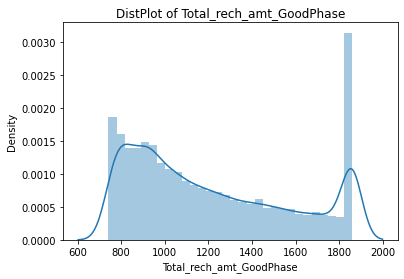

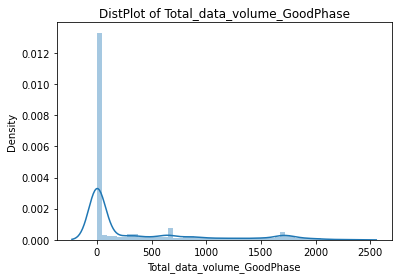

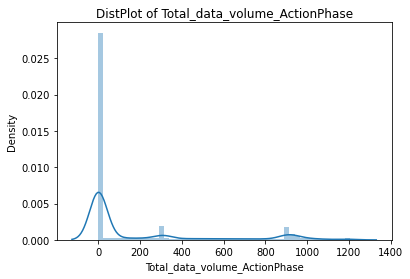

In [53]:
col=HVC.columns
for i in col:
    sns.distplot(HVC[i])
    plt.title('DistPlot of '+i)
    plt.show()

Observation: Most of the variables are right skewed and few of them are having multi nodes as of missing values imputation

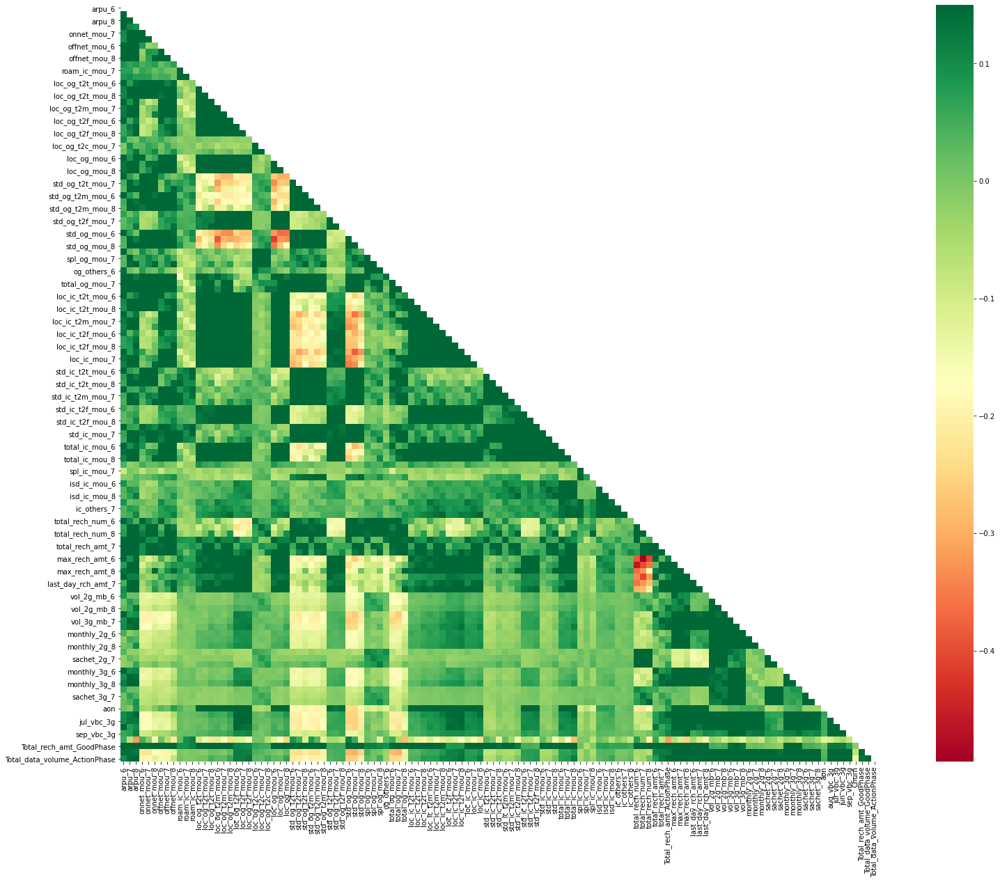

In [54]:
cor=HVC.corr()
mask = np.zeros_like(cor)
mask[np.triu_indices_from(mask)] = True
plt.figure(figsize=(30,20))
sns.heatmap(cor,cmap='RdYlGn', mask=mask, vmax=.15, square=True);

Observation: Most of the variables are highly correlated with each other based on the above heatmap, we are not dropping the highly correlated variables in this step itself rather we will be dealing those during the time of model building using feature extraction techniques and PCA

In [55]:
# Verifying the Churn Rate
churn_rate = round((sum(HVC['Churn'])/len(HVC['Churn'].index)) * 100, 0)
churn_rate

8.0

Observation: The Churn rate is turned out to be 8% here

##### Handling Class Imbalance

In [56]:
y=HVC['Churn']
X=HVC.drop('Churn',axis=1)

In [57]:
y.value_counts()

0    27133
1     2510
Name: Churn, dtype: int64

Observation: We can see that target y is imbalanced. Hence we will perform data balancing with oversampling

In [58]:
import imblearn
from imblearn.over_sampling import SMOTE

In [59]:
SM=SMOTE()
X_over,y_over=SM.fit_resample(X,y)

In [60]:
y_over.value_counts()

0    27133
1    27133
Name: Churn, dtype: int64

Observation: Here the class imbalance is treated and the churn values are equally distributed

In [61]:
y.head()

0    1
1    0
2    0
3    0
4    0
Name: Churn, dtype: int64

##### Test-Train Split

In [62]:
from sklearn.model_selection import train_test_split

In [63]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X_over, y_over, train_size=0.7, test_size=0.3, random_state=100)

##### Feature Scaling

In [64]:
from sklearn.preprocessing import MinMaxScaler

In [65]:
scaler=MinMaxScaler()
X_train=pd.DataFrame(scaler.fit_transform(X_train),columns=X_over.columns)
X_test=pd.DataFrame(scaler.transform(X_test),columns=X_over.columns)

In [66]:
X_train.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,Total_rech_amt_ActionPhase,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,Total_rech_amt_GoodPhase,Total_data_volume_GoodPhase,Total_data_volume_ActionPhase
0,0.599626,0.582239,0.477472,0.874479,0.786847,0.579833,0.201495,0.251262,0.081402,0.0,0.0,0.0,1.000000,1.000000,1.000000,0.407542,0.504098,0.153134,0.0,0.093878,0.0,0.0,0.000000,0.020305,0.891014,0.894652,0.518040,0.000000,0.000000,0.000000,0.00000,0.000000,0.013183,0.0,0.000000,0.000000,0.000000,0.000000,0.004677,0.000000,0.189112,0.134336,0.000000,0.396656,0.380911,0.234049,0.740474,0.376571,0.665599,0.368940,0.265103,0.444604,0.000000,0.005089,0.046856,0.410994,0.258693,0.449743,0.000000,0.000000,0.0,0.011517,0.000000,0.368229,0.000000,0.0000,0.000000,0.006347,0.000000,0.204158,0.335429,0.209396,0.396534,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.500000,0.526316,0.277778,0.427807,0.421622,0.242616,0.196078,0.400000,0.158730,0.181818,0.181818,0.092308,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000,0.000000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.076545,0.0,0.000000,0.000000,0.0,0.042934,0.000000,0.000000
1,0.738840,0.573259,0.578675,1.000000,0.834714,0.884698,0.418694,0.464721,0.398677,0.0,0.0,0.0,0.028235,0.033120,0.011341,0.112115,0.041631,0.069803,0.0,0.057143,0.0,0.0,0.000000,0.000000,0.080791,0.036494,0.049099,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,0.0,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.583647,0.517114,0.521114,0.179945,0.126921,0.511020,0.036951,0.011526,0.016089,0.000000,0.000000,0.008878,0.066030,0.037049,0.131623,0.000000,0.043766,1.0,1.000000,1.000000,1.000000,0.000000,0.0000,0.000000,0.694118,0.715379,1.000000,0.131971,0.115557,0.352408,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.555556,0.421053,0.722222,0.627807,0.358919,0.496835,0.776471,0.400000,0.412698,0.160000,0.400000,0.400000,1.000000,0.000000,0.000000,0.597763,0.0,0.0,1.0,0.0,0.0,0.125,0.000000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.142981,0.0,0.152429,0.475808,0.0,0.158318,0.350061,0.000000
2,1.000000,1.000000,1.000000,0.111618,0.268447,0.617624,1.000000,1.000000,1.000000,0.0,0.0,0.0,0.000000,0.007936,0.050166,1.000000,1.000000,1.000000,1.0,1.000000,1.0,0.0,0.000000,0.000000,1.000000,1.000000,1.000000,0.443503,1.000000,1.000000,0.11050,0.008103,0.052048,0.0,0.284211,1.000000,0.131882,0.208094,0.483585,0.000000,0.000000,0

In [67]:
X_train.shape

(37986, 120)

In [68]:
X_test.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,Total_rech_amt_ActionPhase,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,Total_rech_amt_GoodPhase,Total_data_volume_GoodPhase,Total_data_volume_ActionPhase
0,0.730081,0.461932,0.629766,1.000000,0.286234,0.742820,0.229268,0.234945,0.331591,1.000000,0.0,0.000000,1.000000,0.232157,0.178186,0.206666,0.289609,0.162939,0.000000,0.353061,0.417647,0.000000,0.785124,0.0,0.495399,0.253766,0.158179,1.000000,0.777574,1.000000,0.102721,0.313580,0.985407,0.0,0.0,0.0,0.589632,0.268352,0.864727,0.127354,0.653295,0.048120,0.0000,0.450244,0.220433,0.436211,1.000000,0.271813,0.602883,0.297071,0.449691,0.421271,1.000000,0.503308,1.000000,0.675777,0.374276,0.526491,1.000000,1.000000,1.000000,0.956742,1.000000,1.000000,0.000000,0.000000,0.000000,0.775697,1.000000,1.000000,0.679191,0.616344,0.700659,1.0,1.0,1.0,0.976715,1.000000,0.266132,0.000,0.0,1.000000,0.944444,0.473684,0.833333,0.583957,0.222703,0.453586,0.196078,0.181818,0.349206,0.109091,0.072727,0.061538,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.356730,0.0,0.0,0.0,0.0,0.008945,0.0,0.0
1,1.000000,1.000000,0.764416,0.573737,0.559572,0.470678,0.854728,1.000000,0.701423,0.118236,0.0,0.263108,0.764770,1.000000,0.287842,0.861267,1.000000,0.441088,0.263108,0.248137,0.000000,0.067050,0.000000,0.0,0.861750,1.000000,0.364405,0.638590,0.355401,0.730883,0.916290,1.000000,1.000000,0.0,0.0,0.0,1.000000,1.000000,0.904403,0.542003,0.482844,0.467954,0.6413,1.000000,1.000000,0.661092,1.000000,0.775238,0.409378,0.847604,1.000000,0.453030,0.098115,0.202121,0.157737,1.000000,0.933728,0.399518,0.708009,0.263108,0.935771,0.766750,0.743042,0.763340,0.090282,0.000000,0.000000,1.000000,0.956284,0.780883,1.000000,0.922455,0.501306,0.0,0.0,0.0,0.519395,0.426263,0.000000,0.000,0.0,0.000000,1.000000,0.894737,0.666667,1.000000,1.000000,0.548523,0.470588,0.574545,0.412698,0.400000,0.472727,0.110769,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.268920,0.0,0.0,0.0,0.0,1.000000,0.0,0.0
2,0.821374,0.403716,0.299474,0.192522,0.111256,0.000000,1.000000,0.197790,0.000000,0.000000,1.0,0.043334,0.038577,0.030051,0.000000,0.261159,0.035454,0.000000,0.000000,0.000000,0.000000,0.093548,0.000000,0.0,0.181425,0.030937,0.000000,0.711271,0.000000,0.000000,1.000000,0.528351,0.000000,0.0,0.0,0.0,1.000000,0.189731,0.000000,0.104036,0.000000,0.000000,0.0000,1.000000,0.088424,0.000000,0.12160

In [69]:
y_train.head()

24350    0
26338    0
25255    0
20456    0
1589     0
Name: Churn, dtype: int64

In [70]:
y_test.head()

11342    0
52716    1
274      1
10233    0
25059    0
Name: Churn, dtype: int64

In [71]:
y_train=y_train.reset_index(drop=True)
y_train.head()

0    0
1    0
2    0
3    0
4    0
Name: Churn, dtype: int64

In [72]:
y_test=y_test.reset_index(drop=True)
y_test.head()

0    0
1    1
2    1
3    0
4    0
Name: Churn, dtype: int64

#### Step 7: Model Building (Building 1 Interpretable Model without PCA and 3 High Performance Model with PCA)

##### Building 1 Interpretable Model without PCA

In [73]:
import statsmodels.api as sm

# Running First Training Model i.e Logistic regression model (Interpretabel model)
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                37986
Model:                            GLM   Df Residuals:                    37867
Model Family:                Binomial   Df Model:                          118
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -9992.5
Date:                Mon, 31 May 2021   Deviance:                       19985.
Time:                        22:04:53   Pearson chi2:                 1.16e+05
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
const                          7.953e+04   6.41e+08      0.000      1.000   -1.26e+09    1.26e+09
arpu_6                            0.1557      0.300      0.519      0.604      -0.432       0.743
arpu_7                            2.4111      0.303      7.960      0.000       1.817       3.005
arpu_8                            0.8718      0.311      2.800      0.005       0.262       1.482
onnet_mou_6                       0.1763      0.121      1.456      0.145      -0.061       0.414
onnet_mou_7                       0.1887      0.136      1.385      0.166      -0.078       0.456
onnet_mou_8                      -0.0268      0.139     -0.193      0.847      -0.299       0.246
offnet_mou_6                      0.1171      0.134      0.873      0.383      -0.146       0.380
offnet_mou_7                      0.3801      0.150      2.527      0.012       0.085       0.675
offnet_mou_8                      0.3092      0.149      2.082      0.037       0.018       0.600
roam_ic_mou_6                    -0.1996      0.084     -2.385      0.017      -0.364      -0.036
roam_ic_mou_7                    -0.2083      0.079     -2.636      0.008      -0.363      -0.053
roam_ic_mou_8                     1.3392      0.073     18.278      0.000       1.196       1.483
loc_og_t2t_mou_6                 -0.1040      0.142     -0.731      0.464      -0.383       0.175
loc_og_t2t_mou_7                  0.4216      0.152      2.779      0.005       0.124       0.719
loc_og_t2t_mou_8                 -0.6796      0.166     -4.098      0.000      -1.005      -0.355
loc_og_t2m_mou_6                 -0.3643      0.238     -1.533      0.125      -0.830       0.101
loc_og_t2m_mou_7                  0.1763      0.265      0.666      0.506      -0.343       0.696
loc_og_t2m_mou_8                 -0.4914      0.277     -1.773      0.076      -1.035       0.052
loc_og_t2f_mou_6                 -0.1835      0.076     -2.419      0.016      -0.332      -0.035
loc_og_t2f_mou_7                  0.0095      0.079      0.121      0.903      -0.144       0.163
loc_og_t2f_mou_8                 -0.3047      0.084     -3.646      0.000      -0.468      -0.141
loc_og_t2c_mou_6                 -0.3046      0.085     -3.603      0.000      -0.470      -0.139
loc_og_t2c_mou_7                  0.1527      0.086      1.776      0.076      -0.016       0.321
loc_og_t2c_mou_8                  0.2670      0.095      2.807      0.005       0.081       0.453
loc_og_mou_6                      0.1946      0.286      0.681      0.496      -0.365       0.755
loc_og_mou_7                     -1.3650      0.320     -4.263      0.000      -1.993      -0.737
loc_og_mou_8                      1.2046      0.343      3.509      0.000       0.532       1.877
std_og_t2t_mou_6                 -0.2160     

### Feature selection using RFE

In [74]:
# running RFE with 25 variables as output
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
logreg = LogisticRegression()
rfe = RFE(logreg, 25)             
rfe = rfe.fit(X_train, y_train)

In [75]:
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('arpu_6', False, 60),
 ('arpu_7', True, 1),
 ('arpu_8', False, 8),
 ('onnet_mou_6', False, 76),
 ('onnet_mou_7', False, 43),
 ('onnet_mou_8', False, 79),
 ('offnet_mou_6', False, 84),
 ('offnet_mou_7', False, 32),
 ('offnet_mou_8', False, 47),
 ('roam_ic_mou_6', False, 62),
 ('roam_ic_mou_7', False, 42),
 ('roam_ic_mou_8', True, 1),
 ('loc_og_t2t_mou_6', False, 73),
 ('loc_og_t2t_mou_7', False, 20),
 ('loc_og_t2t_mou_8', False, 19),
 ('loc_og_t2m_mou_6', False, 70),
 ('loc_og_t2m_mou_7', False, 69),
 ('loc_og_t2m_mou_8', False, 33),
 ('loc_og_t2f_mou_6', False, 50),
 ('loc_og_t2f_mou_7', False, 94),
 ('loc_og_t2f_mou_8', False, 12),
 ('loc_og_t2c_mou_6', False, 64),
 ('loc_og_t2c_mou_7', False, 75),
 ('loc_og_t2c_mou_8', False, 40),
 ('loc_og_mou_6', False, 72),
 ('loc_og_mou_7', True, 1),
 ('loc_og_mou_8', False, 18),
 ('std_og_t2t_mou_6', False, 81),
 ('std_og_t2t_mou_7', False, 16),
 ('std_og_t2t_mou_8', False, 15),
 ('std_og_t2m_mou_6', False, 92),
 ('std_og_t2m_mou_7', False, 90

In [76]:
col = X_train.columns[rfe.support_]

In [77]:
X_train.columns[~rfe.support_]

Index(['arpu_6', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8',
       'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6',
       'roam_ic_mou_7', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7',
       'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7',
       'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7',
       'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7',
       'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_8', 'std_og_t2t_mou_6',
       'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6',
       'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6',
       'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_mou_6', 'std_og_mou_7',
       'std_og_mou_8', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8',
       'og_others_6', 'total_og_mou_6', 'total_og_mou_7', 'loc_ic_t2t_mou_6',
       'loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_6',
       'loc_ic_t2m_mou_7', 'loc_ic_t2m_mou_8', 'loc_ic_t2f_mou_6',
       'loc_ic_t

##### Checking p-value and VIF

In [78]:
# Rebuilding the model after completing coarse tuning (RFE):
X_train_sm = sm.add_constant(X_train[col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                37986
Model:                            GLM   Df Residuals:                    37960
Model Family:                Binomial   Df Model:                           25
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -12709.
Date:                Mon, 31 May 2021   Deviance:                       25418.
Time:                        22:06:33   Pearson chi2:                 1.11e+05
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
===============================================================================================
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const                           0.4065      0.072      5.667      0.000       0.266       0.547
arpu_7                          3.3150      0.112     29.664      0.000       3.096       3.534
roam_ic_mou_8                   1.4666      0.054     27.323      0.000       1.361       1.572
loc_og_mou_7                   -0.8874      0.066    -13.531      0.000      -1.016      -0.759
total_og_mou_8                 -1.3714      0.064    -21.591      0.000      -1.496      -1.247
loc_ic_mou_6                   -1.7710      0.175    -10.132      0.000      -2.114      -1.428
loc_ic_mou_8                    2.1218      0.188     11.270      0.000       1.753       2.491
total_ic_mou_6                  2.7938      0.165     16.969      0.000       2.471       3.116
total_ic_mou_8                 -4.5621      0.177    -25.743      0.000      -4.909      -4.215
spl_ic_mou_8                   -1.9215      0.115    -16.656      0.000      -2.148      -1.695
total_rech_num_8               -1.7862      0.074    -24.114      0.000      -1.931      -1.641
last_day_rch_amt_8             -3.0923      0.086    -35.774      0.000      -3.262      -2.923
monthly_2g_6                   -2.2217      0.119    -18.642      0.000      -2.455      -1.988
monthly_2g_7                   -2.0146      0.121    -16.712      0.000      -2.251      -1.778
monthly_2g_8                   -2.7403      0.179    -15.313      0.000      -3.091      -2.390
sachet_2g_6                    -1.0825      0.145     -7.462      0.000      -1.367      -0.798
sachet_2g_8                    -2.6371      0.172    -15.346      0.000      -2.974      -2.300
monthly_3g_6                   -2.5017      0.163    -15.311      0.000      -2.822      -2.181
monthly_3g_7                   -2.2299      0.171    -13.014      0.000      -2.566      -1.894
monthly_3g_8                   -4.2190      0.220    -19.138      0.000      -4.651      -3.787
sachet_3g_6                    -1.8971      0.177    -10.748      0.000      -2.243      -1.551
sachet_3g_7                    -1.0785      0.177     -6.077      0.000      -1.426      -0.731
sachet_3g_8                    -1.9287      0.233     -8.276      0.000      -2.385      -1.472
aon                            -1.3783      0.070    -19.747      0.000      -1.515      -1.241
sep_vbc_3g                     -2.9926      0.163    -18.364      0.000      -3.312      -2.673
Total_data_volume_GoodPhase     4.7199      0.182     25.945      0.000       4.363       5.076
===============================================================================================
"""

##### Checking VIFs

In [79]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def checkVIF(X):
    vif = pd.DataFrame()
    vif['Features'] = X.columns
    vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif['VIF'] = round(vif['VIF'], 2)
    vif = vif.sort_values(by = "VIF", ascending = False)
    return(vif)

In [80]:
checkVIF(X_train_sm)

,Features,VIF
0,const,20.03
6,loc_ic_mou_8,9.41
5,loc_ic_mou_6,9.39
8,total_ic_mou_8,9.33
7,total_ic_mou_6,7.70
25,Total_data_volume_GoodPhase,3.49
4,total_og_mou_8,2.58
18,monthly_3g_7,2.48
3,loc_og_mou_7,2.34
17,monthly_3g_6,2.20


In [81]:
# dropping column 'total_ic_mou_8' which has high VIF (>5)

col = col.drop('total_ic_mou_8', 1)

In [82]:
col

Index(['arpu_7', 'roam_ic_mou_8', 'loc_og_mou_7', 'total_og_mou_8',
       'loc_ic_mou_6', 'loc_ic_mou_8', 'total_ic_mou_6', 'spl_ic_mou_8',
       'total_rech_num_8', 'last_day_rch_amt_8', 'monthly_2g_6',
       'monthly_2g_7', 'monthly_2g_8', 'sachet_2g_6', 'sachet_2g_8',
       'monthly_3g_6', 'monthly_3g_7', 'monthly_3g_8', 'sachet_3g_6',
       'sachet_3g_7', 'sachet_3g_8', 'aon', 'sep_vbc_3g',
       'Total_data_volume_GoodPhase'],
      dtype='object')

In [83]:
# Rebuilding the modelbased on manual tuning (p-values and VIF):
X_train_sm = sm.add_constant(X_train[col])
logm3 = sm.GLM(y_train, X_train_sm, family=sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                37986
Model:                            GLM   Df Residuals:                    37961
Model Family:                Binomial   Df Model:                           24
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -13101.
Date:                Mon, 31 May 2021   Deviance:                       26203.
Time:                        22:06:36   Pearson chi2:                 1.50e+05
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
===============================================================================================
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const                           0.9116      0.067     13.627      0.000       0.780       1.043
arpu_7                          3.1120      0.108     28.747      0.000       2.900       3.324
roam_ic_mou_8                   1.3064      0.053     24.679      0.000       1.203       1.410
loc_og_mou_7                   -0.9836      0.065    -15.202      0.000      -1.110      -0.857
total_og_mou_8                 -1.7328      0.061    -28.205      0.000      -1.853      -1.612
loc_ic_mou_6                    0.3636      0.141      2.587      0.010       0.088       0.639
loc_ic_mou_8                   -2.0391      0.095    -21.366      0.000      -2.226      -1.852
total_ic_mou_6                  0.5826      0.125      4.673      0.000       0.338       0.827
spl_ic_mou_8                   -2.0934      0.116    -18.008      0.000      -2.321      -1.866
total_rech_num_8               -2.0123      0.073    -27.571      0.000      -2.155      -1.869
last_day_rch_amt_8             -3.3089      0.085    -38.875      0.000      -3.476      -3.142
monthly_2g_6                   -2.1758      0.115    -18.944      0.000      -2.401      -1.951
monthly_2g_7                   -2.1032      0.119    -17.701      0.000      -2.336      -1.870
monthly_2g_8                   -2.7516      0.177    -15.536      0.000      -3.099      -2.404
sachet_2g_6                    -1.1328      0.144     -7.890      0.000      -1.414      -0.851
sachet_2g_8                    -2.7330      0.172    -15.875      0.000      -3.070      -2.396
monthly_3g_6                   -2.2859      0.158    -14.496      0.000      -2.595      -1.977
monthly_3g_7                   -2.5355      0.169    -15.001      0.000      -2.867      -2.204
monthly_3g_8                   -4.2050      0.219    -19.209      0.000      -4.634      -3.776
sachet_3g_6                    -1.8013      0.172    -10.471      0.000      -2.138      -1.464
sachet_3g_7                    -1.1648      0.176     -6.615      0.000      -1.510      -0.820
sachet_3g_8                    -2.0033      0.233     -8.613      0.000      -2.459      -1.547
aon                            -1.4228      0.068    -20.895      0.000      -1.556      -1.289
sep_vbc_3g                     -2.9509      0.157    -18.748      0.000      -3.259      -2.642
Total_data_volume_GoodPhase     4.6624      0.179     25.977      0.000       4.311       5.014
===============================================================================================
"""

In [84]:
checkVIF(X_train_sm)

,Features,VIF
0,const,18.93
5,loc_ic_mou_6,8.04
7,total_ic_mou_6,6.29
24,Total_data_volume_GoodPhase,3.49
6,loc_ic_mou_8,2.89
17,monthly_3g_7,2.47
4,total_og_mou_8,2.45
3,loc_og_mou_7,2.34
16,monthly_3g_6,2.20
9,total_rech_num_8,2.16


In [85]:
# dropping column 'loc_ic_mou_6' which has high VIF (>5)

col = col.drop('loc_ic_mou_6', 1)

In [86]:
# Rebuilding the modelbased on manual tuning (p-values and VIF):
X_train_sm = sm.add_constant(X_train[col])
logm4 = sm.GLM(y_train, X_train_sm, family=sm.families.Binomial())
res = logm4.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                37986
Model:                            GLM   Df Residuals:                    37962
Model Family:                Binomial   Df Model:                           23
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -13105.
Date:                Mon, 31 May 2021   Deviance:                       26210.
Time:                        22:06:39   Pearson chi2:                 1.54e+05
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
===============================================================================================
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const                           0.9114      0.067     13.618      0.000       0.780       1.043
arpu_7                          3.1018      0.108     28.665      0.000       2.890       3.314
roam_ic_mou_8                   1.3027      0.053     24.632      0.000       1.199       1.406
loc_og_mou_7                   -0.9388      0.062    -15.073      0.000      -1.061      -0.817
total_og_mou_8                 -1.7495      0.061    -28.629      0.000      -1.869      -1.630
loc_ic_mou_8                   -1.9714      0.092    -21.540      0.000      -2.151      -1.792
total_ic_mou_6                  0.8531      0.068     12.488      0.000       0.719       0.987
spl_ic_mou_8                   -2.0990      0.116    -18.055      0.000      -2.327      -1.871
total_rech_num_8               -2.0092      0.073    -27.536      0.000      -2.152      -1.866
last_day_rch_amt_8             -3.3174      0.085    -39.018      0.000      -3.484      -3.151
monthly_2g_6                   -2.1756      0.115    -18.943      0.000      -2.401      -1.951
monthly_2g_7                   -2.1038      0.119    -17.715      0.000      -2.337      -1.871
monthly_2g_8                   -2.7568      0.177    -15.569      0.000      -3.104      -2.410
sachet_2g_6                    -1.1285      0.143     -7.866      0.000      -1.410      -0.847
sachet_2g_8                    -2.7438      0.172    -15.949      0.000      -3.081      -2.407
monthly_3g_6                   -2.2930      0.158    -14.550      0.000      -2.602      -1.984
monthly_3g_7                   -2.5367      0.169    -15.009      0.000      -2.868      -2.205
monthly_3g_8                   -4.2141      0.219    -19.271      0.000      -4.643      -3.786
sachet_3g_6                    -1.8038      0.172    -10.483      0.000      -2.141      -1.467
sachet_3g_7                    -1.1615      0.176     -6.599      0.000      -1.506      -0.816
sachet_3g_8                    -2.0113      0.233     -8.638      0.000      -2.468      -1.555
aon                            -1.4134      0.068    -20.802      0.000      -1.547      -1.280
sep_vbc_3g                     -2.9609      0.158    -18.795      0.000      -3.270      -2.652
Total_data_volume_GoodPhase     4.6736      0.179     26.037      0.000       4.322       5.025
===============================================================================================
"""

In [87]:
#check VIF
checkVIF(X_train_sm)

,Features,VIF
0,const,18.92
23,Total_data_volume_GoodPhase,3.49
5,loc_ic_mou_8,2.70
16,monthly_3g_7,2.47
4,total_og_mou_8,2.42
15,monthly_3g_6,2.20
8,total_rech_num_8,2.16
3,loc_og_mou_7,2.15
11,monthly_2g_7,1.91
17,monthly_3g_8,1.91


Observation: All p-values are less than 0.05 and all VIFs are less than 5. We will consider this as a final model

##### Predict the train values

In [88]:
y_train_pred = res.predict(X_train_sm)
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([4.73765999e-01, 1.12632193e-01, 7.86156476e-06, 6.53538662e-02,
       4.66322426e-02, 8.97424338e-01, 2.80451000e-02, 5.27244347e-02,
       7.04897143e-03, 8.78759391e-01])

In [89]:
y_train_pred_final=pd.DataFrame(y_train,columns=['Churn'])
y_train_pred_final.head()

,Churn
0,0
1,0
2,0
3,0
4,0


In [90]:
y_train_pred_final['Churn_Prob'] = y_train_pred
y_train_pred_final.head()

,Churn,Churn_Prob
0,0,0.473766
1,0,0.112632
2,0,0.000008
3,0,0.065354
4,0,0.046632


In [91]:
# Convert predicted probability to 0 and 1 considering 0.5 as cut-off
y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,predicted
0,0,0.473766,0
1,0,0.112632,0
2,0,0.000008,0
3,0,0.065354,0
4,0,0.046632,0


Observation: Churn probability are converted into predicted using 0.5 cut-off value

In [92]:
from sklearn import metrics

In [93]:
accuracy = metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted)
print(accuracy)

0.8589743589743589


In [94]:
# Let's take a look at the confusion matrix again 
confusion = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.predicted )
confusion

array([[16205,  2829],
       [ 2528, 16424]], dtype=int64)

In [95]:
# Plotting the ROC curve

def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [96]:
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.Churn, y_train_pred_final.Churn_Prob, drop_intermediate = False)

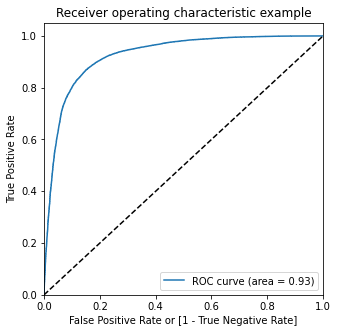

In [97]:
draw_roc(y_train_pred_final.Churn, y_train_pred_final.Churn_Prob)

Observation:
* Area under curve of 0.93 indicated the good performance of present model 
* And the graph is leaned towards the left side of the border which means there is good accuracy

##### Finding Optimal Cutoff Point

In [98]:
# Creating columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.473766,0,1,1,1,1,1,0,0,0,0,0
1,0,0.112632,0,1,1,0,0,0,0,0,0,0,0
2,0,0.000008,0,1,0,0,0,0,0,0,0,0,0
3,0,0.065354,0,1,0,0,0,0,0,0,0,0,0
4,0,0.046632,0,1,0,0,0,0,0,0,0,0,0


In [99]:
# Calculating accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.498921  1.000000  0.000000
0.1   0.1  0.739588  0.981796  0.498424
0.2   0.2  0.798320  0.958738  0.638594
0.3   0.3  0.835755  0.936313  0.735631
0.4   0.4  0.853183  0.904496  0.802091
0.5   0.5  0.858974  0.866610  0.851371
0.6   0.6  0.854341  0.821444  0.887097
0.7   0.7  0.841889  0.765935  0.917516
0.8   0.8  0.806929  0.670008  0.943259
0.9   0.9  0.707103  0.440270  0.972786


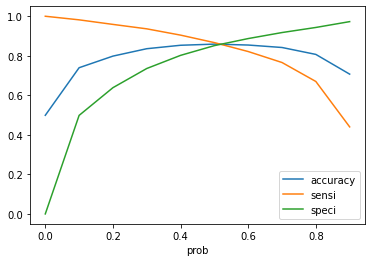

In [100]:
#Plotting the graph above
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

#### From the above curve, the optimum point lies slightly ahead of 0.50. 
* We will consider 0.5 as cut-off score

In [101]:
y_train_pred_final['Final_predicted'] = y_train_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.5 else 0)

y_train_pred_final.head(10)

,Churn,Churn_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,Final_predicted
0,0,0.473766,0,1,1,1,1,1,0,0,0,0,0,0
1,0,0.112632,0,1,1,0,0,0,0,0,0,0,0,0
2,0,0.000008,0,1,0,0,0,0,0,0,0,0,0,0
3,0,0.065354,0,1,0,0,0,0,0,0,0,0,0,0
4,0,0.046632,0,1,0,0,0,0,0,0,0,0,0,0
5,0,0.897424,1,1,1,1,1,1,1,1,1,1,0,1
6,0,0.028045,0,1,0,0,0,0,0,0,0,0,0,0
7,0,0.052724,0,1,0,0,0,0,0,0,0,0,0,0
8,0,0.007049,0,1,0,0,0,0,0,0,0,0,0,0
9,1,0.878759,1,1,1,1,1,1,1,1,1,1,0,1


In [102]:
scores=pd.DataFrame(index=['LogReg_Train','LogReg_Test','RF_Train','RF_Test','XGB_Train','XGB_Test','LogRegPCA_Train','LogRegPCA_Test'],
                    columns=['Accuracy','Precision','Specificity','Sensitivity','F1Score'])
scores

,Accuracy,Precision,Specificity,Sensitivity,F1Score
LogReg_Train,NaN,NaN,NaN,NaN,NaN
LogReg_Test,NaN,NaN,NaN,NaN,NaN
RF_Train,NaN,NaN,NaN,NaN,NaN
RF_Test,NaN,NaN,NaN,NaN,NaN
XGB_Train,NaN,NaN,NaN,NaN,NaN
XGB_Test,NaN,NaN,NaN,NaN,NaN
LogRegPCA_Train,NaN,NaN,NaN,NaN,NaN
LogRegPCA_Test,NaN,NaN,NaN,NaN,NaN


Note: The performance metrics for the different models are stored in a dataframed called 'Scores'

In [103]:
accuracy = metrics.accuracy_score(y_train_pred_final.Churn, y_train_pred_final.Final_predicted)
scores['Accuracy']['LogReg_Train']=accuracy
print(accuracy)

0.8589743589743589


In [104]:
# Let's take a look at the confusion matrix again 
confusion = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.Final_predicted)
confusion

array([[16205,  2829],
       [ 2528, 16424]], dtype=int64)

In [105]:
# Confusion Matrix
TP = confusion[1,1] # True Positive
TN = confusion[0,0] # True Negative
FP = confusion[0,1] # False Positive
FN = confusion[1,0] # False Negative

In [106]:
# Verifying Sensitivity of logistic regression model
sensitivity = TP / float(FN+TP)
scores['Sensitivity']['LogReg_Train']=sensitivity
print(sensitivity)

0.8666103841283241


In [107]:
# Verifying Specificity of logistic regression model
specificity = TN / float(TN+FP)
scores['Specificity']['LogReg_Train']=specificity
print(specificity)

0.8513712304297573


In [108]:
# Verifying Precision of logistic regression model
precision = TP / float(TP+FP)
scores['Precision']['LogReg_Train']=precision
print(precision)

0.8530618604892743


In [109]:
# Verifying F1 Score of logistic regression model
F1Score = 2 * precision * sensitivity / (precision+sensitivity)
scores['F1Score']['LogReg_Train']=F1Score
print(F1Score)

0.8597827509488287


#####  Making predictions on the test set

In [110]:
# adding constant
X_test_sm = sm.add_constant(X_test[col])
X_test_sm.shape

(16280, 24)

In [111]:
# Making prediction
y_test_pred = res.predict(X_test_sm)

In [112]:
y_test_pred[:10]

0    0.026665
1    0.559469
2    0.911700
3    0.084393
4    0.076243
5    0.209979
6    0.877492
7    0.969144
8    0.915211
9    0.584935
dtype: float64

In [113]:
# Creating dataframe for prediction dataset
y_pred_final = pd.DataFrame(y_test,columns=['Churn'])
y_pred_final['Churn_Prob']=y_test_pred
y_pred_final.head()

,Churn,Churn_Prob
0,0,0.026665
1,1,0.559469
2,1,0.911700
3,0,0.084393
4,0,0.076243


In [114]:
y_pred_final['Final_predicted'] = y_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)

y_pred_final.head(10)

,Churn,Churn_Prob,Final_predicted
0,0,0.026665,0
1,1,0.559469,1
2,1,0.911700,1
3,0,0.084393,0
4,0,0.076243,0
5,1,0.209979,0
6,1,0.877492,1
7,1,0.969144,1
8,1,0.915211,1
9,0,0.584935,1


In [115]:
# Let's check the overall accuracy.
accuracy_test = metrics.accuracy_score(y_pred_final.Churn, y_pred_final.Final_predicted)
scores['Accuracy']['LogReg_Test']=accuracy_test
accuracy_test

0.8539312039312039

In [116]:
confusion_test = metrics.confusion_matrix(y_pred_final.Churn, y_pred_final.Final_predicted )
confusion_test

array([[6857, 1242],
       [1136, 7045]], dtype=int64)

In [117]:
# Confusion Matrix
TP = confusion_test[1,1] # True Positive
TN = confusion_test[0,0] # True Negative
FP = confusion_test[0,1] # False Positive
FN = confusion_test[1,0] # False Negative

In [118]:
# Verifying Sensitivity of prediction on test set
sensitivity = TP / float(FN+TP)
scores['Sensitivity']['LogReg_Test']=sensitivity
print(sensitivity)

0.8611416697225278


In [119]:
# Verifying Specificity of prediction on test set
specificity = TN / float(TN+FP)
scores['Specificity']['LogReg_Test']=specificity
print(specificity)

0.8466477342881837


In [120]:
# Verifying Precision of prediction on test set
precision = TP / float(TP+FP)
scores['Precision']['LogReg_Test']=precision
print(precision)

0.8501267044768915


In [121]:
# Verifying F1 Score of prediction on test set
F1Score = 2 * precision * sensitivity / (precision+sensitivity)
scores['F1Score']['LogReg_Test']=F1Score
print(F1Score)

0.8555987369443769


##### Applying PCA on the dataset for the high performance models

In [122]:
X_train.shape

(37986, 120)

In [123]:
from sklearn.decomposition import PCA

In [124]:
pca=PCA(random_state=50)

In [125]:
pca.fit(X_train)

PCA(random_state=50)

In [126]:
pca.components_

array([[ 1.18814236e-02,  4.09519927e-02,  8.68086482e-02, ...,
         6.07706364e-02,  4.41458865e-02,  4.84247627e-02],
       [ 1.88955993e-02,  6.20442960e-02,  7.17243925e-02, ...,
         9.47531964e-02, -5.01454262e-02, -3.00802103e-02],
       [-9.22364682e-02,  5.38106492e-02,  1.40165961e-01, ...,
        -3.25914760e-02,  9.86262531e-02,  1.05410773e-01],
       ...,
       [ 3.60848801e-06, -4.50226929e-05,  1.87040663e-05, ...,
         6.47725387e-01, -2.68415537e-05,  9.79244763e-07],
       [-6.99705346e-16,  2.19440658e-16, -5.94681559e-17, ...,
         1.57792839e-14,  3.94500550e-01, -7.02315613e-01],
       [ 0.00000000e+00,  1.62712361e-16, -2.31559554e-17, ...,
        -3.42259193e-15,  7.84000533e-01,  3.53397586e-01]])

In [127]:
# Looking at the explained variance ratio for each component
pca.explained_variance_ratio_

array([1.91821797e-01, 1.51116254e-01, 6.78906143e-02, 4.98572752e-02,
       4.19257990e-02, 3.69590515e-02, 3.17667555e-02, 2.91129328e-02,
       2.20062899e-02, 1.95883570e-02, 1.56701021e-02, 1.42655330e-02,
       1.37086776e-02, 1.30153557e-02, 1.19628347e-02, 1.11335098e-02,
       1.06596313e-02, 9.91351442e-03, 9.22585838e-03, 8.97621557e-03,
       8.70434871e-03, 8.47116616e-03, 7.72530959e-03, 7.51761141e-03,
       7.22831065e-03, 7.07361474e-03, 6.49922385e-03, 6.20004300e-03,
       5.76630010e-03, 5.47295589e-03, 5.30706955e-03, 5.14639371e-03,
       4.89778088e-03, 4.60721631e-03, 4.48211461e-03, 4.35026771e-03,
       4.19218515e-03, 4.14625371e-03, 4.08420245e-03, 3.93179403e-03,
       3.82949290e-03, 3.80013834e-03, 3.65421117e-03, 3.62387129e-03,
       3.52006524e-03, 3.38099427e-03, 3.29517816e-03, 3.24538748e-03,
       3.11612340e-03, 3.01924602e-03, 2.89249729e-03, 2.84075414e-03,
       2.76845909e-03, 2.72809993e-03, 2.67963742e-03, 2.61678775e-03,
      

##### Making a scree plot for the explained variance

In [128]:
var_cumu = np.cumsum(pca.explained_variance_ratio_)

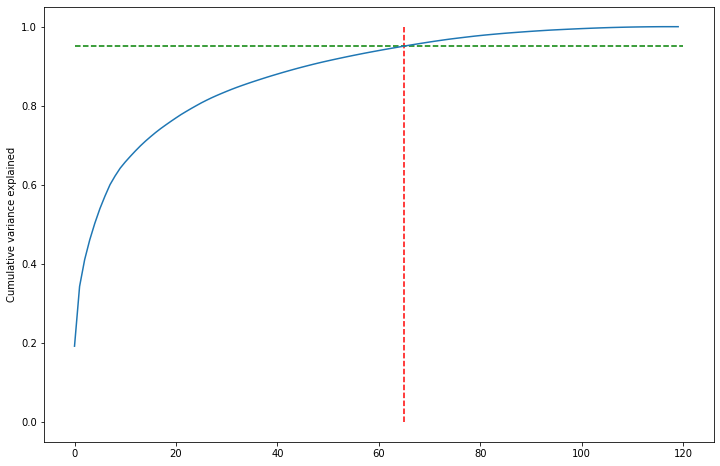

In [129]:
fig = plt.figure(figsize=[12,8])
plt.vlines(x=65, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.95, xmax=120, xmin=0, colors="g", linestyles="--")
plt.plot(var_cumu)
plt.ylabel("Cumulative variance explained")
plt.show()

Observation: We need to Perform PCA with 66 components

In [130]:
from sklearn.decomposition import IncrementalPCA

In [131]:
pca_final = IncrementalPCA(n_components=66)

In [132]:
df_train_pca = pca_final.fit_transform(X_train)

In [133]:
df_train_pca.shape

(37986, 66)

In [134]:
corrmat = np.corrcoef(df_train_pca.transpose())

In [135]:
corrmat.shape

(66, 66)

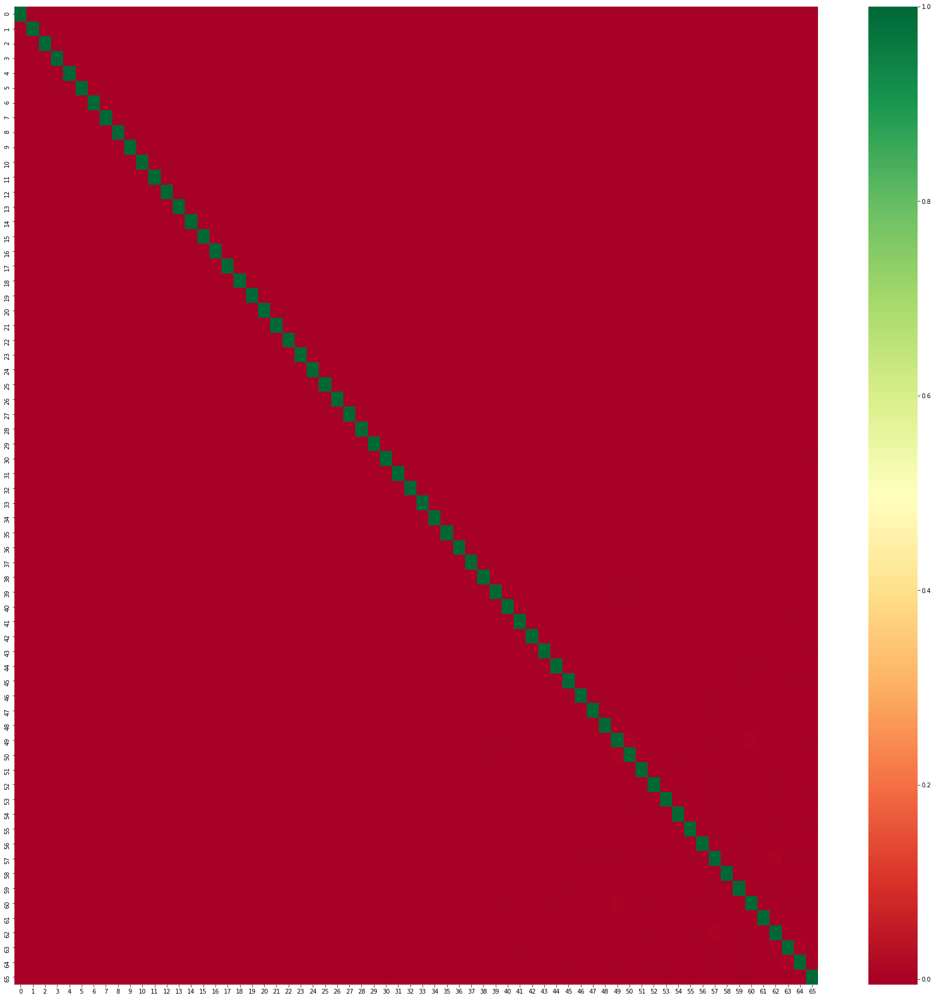

In [136]:
#plot heat map for PCA components
plt.figure(figsize=[30,30])
sns.heatmap(corrmat, cmap='RdYlGn')
plt.show();

Observation: From the above heatmap it is clearly visible that all the PCA components are low in correlation

In [137]:
# Apply PCA on test set
df_test_pca = pca_final.transform(X_test)
df_test_pca.shape

(16280, 66)

##### Building Random Forest Model 

In [138]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, accuracy_score

In [139]:
rf=RandomForestClassifier(n_estimators=20,max_depth=5,max_features=30,random_state=50,oob_score=True)

In [140]:
%%time
rf.fit(df_train_pca,y_train)

Wall time: 11.8 s


RandomForestClassifier(max_depth=5, max_features=30, n_estimators=20,
                       oob_score=True, random_state=50)

In [141]:
rf.oob_score_

0.828147212130785

In [142]:
from sklearn.metrics import plot_roc_curve

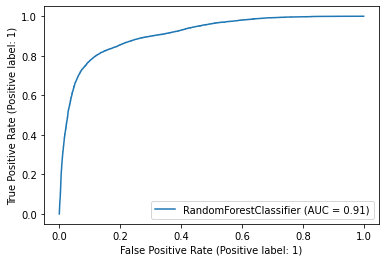

In [143]:
plot_roc_curve(rf, df_train_pca, y_train)
plt.show()

Observation:

- Area under curve of 0.91 indicated the good performance of present model
- And the graph is leaned towards the left side of the border which means there is good accuracy

##### Hyper-parameter tuning for the Random Forest

In [144]:
from sklearn.model_selection import GridSearchCV

In [145]:
rf = RandomForestClassifier(random_state=50, n_jobs=-1)

In [146]:
params = {
    'max_depth': [5,10,20,30],
    'min_samples_leaf': [5,10,20],
    'n_estimators': [10,20,30,50]
}


In [147]:
grid_search = GridSearchCV(estimator=rf,
                           param_grid=params,
                           cv = 3,
                           n_jobs=-1, verbose=1, scoring="accuracy")

In [148]:
%%time
grid_search.fit(df_train_pca,y_train)

Fitting 3 folds for each of 48 candidates, totalling 144 fits
Wall time: 6min 50s


GridSearchCV(cv=3, estimator=RandomForestClassifier(n_jobs=-1, random_state=50),
             n_jobs=-1,
             param_grid={'max_depth': [5, 10, 20, 30],
                         'min_samples_leaf': [5, 10, 20],
                         'n_estimators': [10, 20, 30, 50]},
             scoring='accuracy', verbose=1)

In [149]:
grid_search.best_estimator_

RandomForestClassifier(max_depth=30, min_samples_leaf=5, n_estimators=50,
                       n_jobs=-1, random_state=50)

In [150]:
rf_best=grid_search.best_estimator_
rf_best

RandomForestClassifier(max_depth=30, min_samples_leaf=5, n_estimators=50,
                       n_jobs=-1, random_state=50)

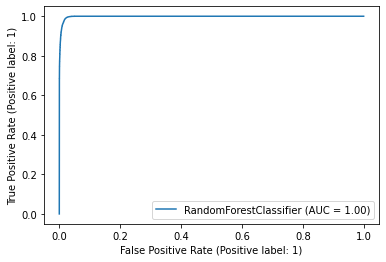

In [151]:
plot_roc_curve(rf_best,df_train_pca,y_train)
plt.show()

Observation:

- Area under curve of 1 for train set indicated the best performance of present model after hyperparameter tuning
- And the graph is leaned towards the left side of the border which means there is good accuracy

In [152]:
rf_best.feature_importances_

array([0.15902534, 0.03211189, 0.08910937, 0.03983867, 0.00878133,
       0.01646836, 0.00916588, 0.06283158, 0.01870065, 0.0191184 ,
       0.00973651, 0.01206801, 0.02099469, 0.01692715, 0.02227421,
       0.02960118, 0.00844183, 0.02173985, 0.00672536, 0.00567296,
       0.00579096, 0.00828228, 0.00744467, 0.0118166 , 0.00677803,
       0.02026169, 0.00698822, 0.00678536, 0.00775074, 0.01010542,
       0.00590984, 0.01038336, 0.00764033, 0.0088809 , 0.00573374,
       0.0090495 , 0.00498217, 0.0078289 , 0.00610738, 0.00635778,
       0.00684836, 0.0074754 , 0.00842316, 0.0072038 , 0.01095655,
       0.01096557, 0.0071676 , 0.00676717, 0.0109894 , 0.00965236,
       0.01153264, 0.00611671, 0.00945578, 0.00635821, 0.00647606,
       0.00495105, 0.0069941 , 0.01820661, 0.01253922, 0.00653982,
       0.00593188, 0.01839648, 0.00585228, 0.0061146 , 0.00724609,
       0.00662801])

In [153]:
def evaluate_model(classifier):
    print("Train Accuracy :", accuracy_score(y_train, classifier.predict(df_train_pca)))
    print("Train Confusion Matrix:")
    print(confusion_matrix(y_train, classifier.predict(df_train_pca)))
    print("-"*50)
    print("Test Accuracy :", accuracy_score(y_test, classifier.predict(df_test_pca)))
    print("Test Confusion Matrix:")
    print(confusion_matrix(y_test, classifier.predict(df_test_pca)))

In [154]:
evaluate_model(rf_best)

Train Accuracy : 0.9846259148107197
Train Confusion Matrix:
[[18610   424]
 [  160 18792]]
--------------------------------------------------
Test Accuracy : 0.9328624078624078
Test Confusion Matrix:
[[7603  496]
 [ 597 7584]]


In [155]:
y_train_pred_RF=rf_best.predict(df_train_pca)

In [156]:
y_train_pred_RF_Final=pd.DataFrame(y_train,columns=['Churn'])
y_train_pred_RF_Final['Predicted_Churn']=y_train_pred_RF
y_train_pred_RF_Final.head()

,Churn,Predicted_Churn
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0


In [157]:
y_test_pred_RF=rf_best.predict(df_test_pca)
y_test_pred_RF_Final=pd.DataFrame(y_test,columns=['Churn'])
y_test_pred_RF_Final['Predicted_Churn']=y_test_pred_RF
y_test_pred_RF_Final.head()

,Churn,Predicted_Churn
0,0,0
1,1,1
2,1,1
3,0,0
4,0,0


#### Performance on Train Set

In [158]:
confusion_train = metrics.confusion_matrix(y_train_pred_RF_Final.Churn, y_train_pred_RF_Final.Predicted_Churn )
confusion_train

array([[18610,   424],
       [  160, 18792]], dtype=int64)

In [159]:
# Confusion Matrix
TP = confusion_train[1,1] # True Positive
TN = confusion_train[0,0] # True Negative
FP = confusion_train[0,1] # False Positive
FN = confusion_train[1,0] # False Negative

In [160]:
accuracy_train = metrics.accuracy_score(y_train_pred_RF_Final.Churn, y_train_pred_RF_Final.Predicted_Churn)
scores['Accuracy']['RF_Train']=accuracy_train
accuracy_train

0.9846259148107197

In [161]:
# Verifying Sensitivity of prediction on train set
sensitivity = TP / float(FN+TP)
scores['Sensitivity']['RF_Train']=sensitivity
print(sensitivity)

0.9915576192486281


In [162]:
# Verifying Specificity of prediction on train set
specificity = TN / float(TN+FP)
scores['Specificity']['RF_Train']=specificity
print(specificity)

0.977724072711989


In [163]:
# Verifying Precision of prediction on train set
precision = TP / float(TP+FP)
scores['Precision']['RF_Train']=precision
print(precision)

0.9779350541215653


In [164]:
# Verifying F1 Score of prediction on train set
F1Score = 2 * precision * sensitivity / (precision+sensitivity)
scores['F1Score']['RF_Train']=F1Score
print(F1Score)

0.9846992244812408


##### Performance on test set

In [165]:
confusion_test = metrics.confusion_matrix(y_test_pred_RF_Final.Churn, y_test_pred_RF_Final.Predicted_Churn )
confusion_test

array([[7603,  496],
       [ 597, 7584]], dtype=int64)

In [166]:
# Confusion Matrix
TP = confusion_test[1,1] # True Positive
TN = confusion_test[0,0] # True Negative
FP = confusion_test[0,1] # False Positive
FN = confusion_test[1,0] # False Negative

In [167]:
accuracy_test = metrics.accuracy_score(y_test_pred_RF_Final.Churn, y_test_pred_RF_Final.Predicted_Churn)
scores['Accuracy']['RF_Test']=accuracy_test
accuracy_test

0.9328624078624078

In [168]:
# Verifying Sensitivity of prediction on test set
sensitivity = TP / float(FN+TP)
scores['Sensitivity']['RF_Test']=sensitivity
print(sensitivity)

0.927026035936927


In [169]:
# Verifying Specificity of prediction on test set
specificity = TN / float(TN+FP)
scores['Specificity']['RF_Test']=specificity
print(specificity)

0.9387578713421411


In [170]:
# Verifying Precision of prediction on test set
precision = TP / float(TP+FP)
scores['Precision']['RF_Test']=precision
print(precision)

0.9386138613861386


In [171]:
# Verifying F1 Score of prediction on test set
F1Score = 2 * precision * sensitivity / (precision+sensitivity)
scores['F1Score']['RF_Test']=F1Score
print(F1Score)

0.9327839616259763


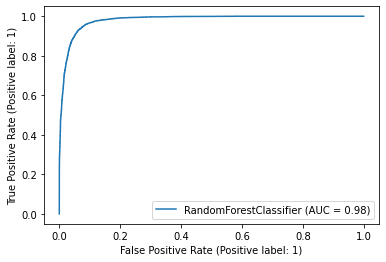

In [172]:
plot_roc_curve(rf_best,df_test_pca,y_test)
plt.show()

Observation:

- Area under curve of 0.98 for test set indicated the best performance
- And the graph is leaned towards the left side of the border which means there is good accuracy

##### Building XGBoost model

In [173]:
import xgboost as xgb

In [174]:
xgclf = xgb.XGBClassifier()
xgclf.fit(df_train_pca, y_train)

[22:14:24] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=4, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [175]:
print('AUC on train data by XGBoost =', metrics.roc_auc_score(y_true=y_train,
                                                              y_score=xgclf.predict_proba(df_train_pca)[:, 1]))

AUC on train data by XGBoost = 0.9994487353571777


In [176]:
print('AUC on test data by XGBoost =', metrics.roc_auc_score(y_true=y_test,
                                                             y_score=xgclf.predict_proba(df_test_pca)[:, 1]))

AUC on test data by XGBoost = 0.9859183624526451


In [177]:
%%time
xgb_model = xgb.XGBClassifier()

# Default-Run of default-hyperparameters
parameters = {'learning_rate': [0.3],
              'max_depth': [6],
              'min_child_weight': [1],
              'n_estimators': [100]}

scorer = metrics.make_scorer(metrics.roc_auc_score,
                             greater_is_better=True,
                             needs_proba=True,
                             needs_threshold=False)

clf_xgb = GridSearchCV(estimator=xgb_model,
                                       param_grid=parameters,
                                       n_jobs=-1,
                                       cv=5,
                                       scoring=scorer,
                                       refit=True)

clf_xgb.fit(df_train_pca, y_train)

[22:18:35] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Wall time: 4min 3s


GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, subsample=None,
                                     tree_method=None,

In [178]:
print(clf_xgb.best_params_)
print(clf_xgb.best_score_)
print(clf_xgb.best_estimator_)

{'learning_rate': 0.3, 'max_depth': 6, 'min_child_weight': 1, 'n_estimators': 100}
0.9849581324968956
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.3, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=4, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)


In [179]:
accuracy=metrics.accuracy_score(y_train, clf_xgb.predict(df_train_pca))
print(accuracy)

0.9913125888485231


* Since we are getting high accuracy close to 1, we will reduce learning rate and n_estimatore using hyperparameter tuning to avoid over fitting.

##### Hyperparameter tuning

In [180]:
parameters = {'learning_rate': [0.1],
              'max_depth': [2,4,6],
              'min_child_weight': [1,3],
              'n_estimators': [10,30,50,60]
             }

scorer = metrics.make_scorer(metrics.roc_auc_score,
                             greater_is_better=True,
                             needs_proba=True,
                             needs_threshold=False)

clf_xgb = GridSearchCV(estimator=xgb_model,
                                       param_grid=parameters,
                                       n_jobs=-1,
                                       cv=5,
                                       scoring=scorer,
                                       verbose=1,
                                       refit=True)


In [181]:
%%time
clf_xgb.fit(df_train_pca, y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits
[22:40:13] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Wall time: 21min 13s


GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, gamma=None,
                                     gpu_id=None, importance_type='gain',
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs...e,
                                     num_parallel_tree=None, random_state=None,
                                     reg_alpha=None, reg_lambda=None,
                                     scale_pos_weight=None, subsample=None,
                                     tree_method=None, 

In [182]:
print(clf_xgb.best_params_)
print(clf_xgb.best_score_)
print(clf_xgb.best_estimator_)

{'learning_rate': 0.1, 'max_depth': 6, 'min_child_weight': 1, 'n_estimators': 60}
0.9625250407692837
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=60, n_jobs=4, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)


In [183]:
y_pred_train_XGB=clf_xgb.predict(df_train_pca)

In [184]:
y_pred_train_XGB_Final=pd.DataFrame(y_train,columns=['Churn'])
y_pred_train_XGB_Final['Predicted_Churn']=y_pred_train_XGB
y_pred_train_XGB_Final.head()

,Churn,Predicted_Churn
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0


In [185]:
y_pred_train_XGB_Final.Predicted_Churn.value_counts()

1    19019
0    18967
Name: Predicted_Churn, dtype: int64

In [186]:
y_pred_test_XGB=clf_xgb.predict(df_test_pca)
y_pred_test_XGB_Final=pd.DataFrame(y_test,columns=['Churn'])
y_pred_test_XGB_Final['Predicted_Churn']=y_pred_test_XGB
y_pred_test_XGB_Final.head()

,Churn,Predicted_Churn
0,0,0
1,1,1
2,1,1
3,0,0
4,0,0


##### Check performance on Train data

In [187]:
confusion_train = metrics.confusion_matrix(y_pred_train_XGB_Final.Churn, y_pred_train_XGB_Final.Predicted_Churn )
confusion_train

array([[17622,  1412],
       [ 1345, 17607]], dtype=int64)

In [188]:
# Confusion Matrix
TP = confusion_train[1,1] # True Positive
TN = confusion_train[0,0] # True Negative
FP = confusion_train[0,1] # False Positive
FN = confusion_train[1,0] # False Negative

In [189]:
accuracy_train = metrics.accuracy_score(y_pred_train_XGB_Final.Churn, y_pred_train_XGB_Final.Predicted_Churn)
scores['Accuracy']['XGB_Train']=accuracy_train
accuracy_train

0.9274206286526615

In [190]:
# Verifying Sensitivity of prediction on train set
sensitivity = TP / float(FN+TP)
scores['Sensitivity']['XGB_Train']=sensitivity
print(sensitivity)

0.9290312368087801


In [191]:
# Verifying Specificity of prediction on train set
specificity = TN / float(TN+FP)
scores['Specificity']['XGB_Train']=specificity
print(specificity)

0.9258169591257749


In [192]:
# Verifying Precision of prediction on train set
precision = TP / float(TP+FP)
scores['Precision']['XGB_Train']=precision
print(precision)

0.9257584520742416


In [193]:
# Verifying F1 Score of prediction on train set
F1Score = 2 * precision * sensitivity / (precision+sensitivity)
scores['F1Score']['XGB_Train']=F1Score
print(F1Score)

0.927391957019831


##### Check performance on Test data

In [194]:
confusion_test = metrics.confusion_matrix(y_pred_test_XGB_Final.Churn, y_pred_test_XGB_Final.Predicted_Churn )
confusion_test

array([[7271,  828],
       [ 883, 7298]], dtype=int64)

In [195]:
# Confusion Matrix
TP = confusion_test[1,1] # True Positive
TN = confusion_test[0,0] # True Negative
FP = confusion_test[0,1] # False Positive
FN = confusion_test[1,0] # False Negative

In [196]:
accuracy_test = metrics.accuracy_score(y_pred_train_XGB_Final.Churn, y_pred_train_XGB_Final.Predicted_Churn)
scores['Accuracy']['XGB_Test']=accuracy_test
accuracy_test

0.9274206286526615

In [197]:
# Verifying Sensitivity of prediction on test set
sensitivity = TP / float(FN+TP)
scores['Sensitivity']['XGB_Test']=sensitivity
print(sensitivity)

0.8920669844762255


In [198]:
# Verifying Specificity of prediction on test set
specificity = TN / float(TN+FP)
scores['Specificity']['XGB_Test']=specificity
print(specificity)

0.8977651561921225


In [199]:
# Verifying Precision of prediction on test set
precision = TP / float(TP+FP)
scores['Precision']['XGB_Test']=precision
print(precision)

0.8981048486340143


In [200]:
# Verifying F1 Score of prediction on test set
F1Score = 2 * precision * sensitivity / (precision+sensitivity)
scores['F1Score']['XGB_Test']=F1Score
print(F1Score)

0.8950757343472128


##### Building Logistic Regression with PCA

In [201]:
LRPCA=LogisticRegression()

In [202]:
model_pca = LRPCA.fit(df_train_pca, y_train)

In [203]:
pred_probs_train = model_pca.predict_proba(df_train_pca)
pred_probs_train

array([[0.56354107, 0.43645893],
       [0.8999361 , 0.1000639 ],
       [0.99848554, 0.00151446],
       ...,
       [0.83530325, 0.16469675],
       [0.87322099, 0.12677901],
       [0.1236273 , 0.8763727 ]])

In [204]:
"{:2.2}".format(metrics.roc_auc_score(y_train, pred_probs_train[:,1]))

'0.92'

In [205]:
pred_probs_test = model_pca.predict_proba(df_test_pca)
pred_probs_test

array([[0.98494766, 0.01505234],
       [0.60224757, 0.39775243],
       [0.09204164, 0.90795836],
       ...,
       [0.1038552 , 0.8961448 ],
       [0.14186592, 0.85813408],
       [0.42936264, 0.57063736]])

In [206]:
"{:2.2}".format(metrics.roc_auc_score(y_test, pred_probs_test[:,1]))

'0.92'

Observation: Area under curve score of 0.92 for both train and test sets indicated the good performance of model 

In [207]:
y_pred_train_LR_PCA=model_pca.predict(df_train_pca)
y_pred_train_LR_PCA=pd.DataFrame(y_pred_train_LR_PCA,columns=['Predicted'])
y_pred_train_LR_PCA['Churn']=y_train
y_pred_train_LR_PCA.head()

,Predicted,Churn
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0


In [208]:
y_pred_test_LR_PCA=model_pca.predict(df_test_pca)
y_pred_test_LR_PCA=pd.DataFrame(y_pred_test_LR_PCA,columns=['Predicted'])
y_pred_test_LR_PCA['Churn']=y_test
y_pred_test_LR_PCA.head()

,Predicted,Churn
0,0,0
1,0,1
2,1,1
3,0,0
4,0,0


##### Analyse performanse on Train data

In [209]:
accuracy = metrics.accuracy_score(y_pred_train_LR_PCA.Churn, y_pred_train_LR_PCA.Predicted)
scores['Accuracy']['LogRegPCA_Train']=accuracy
print(accuracy)

0.8539198652134997


In [210]:
# Let's take a look at the confusion matrix again 
confusion = metrics.confusion_matrix(y_pred_train_LR_PCA.Churn, y_pred_train_LR_PCA.Predicted)
confusion

array([[16291,  2743],
       [ 2806, 16146]], dtype=int64)

In [211]:
# Confusion Matrix
TP = confusion[1,1] # True Positive
TN = confusion[0,0] # True Negative
FP = confusion[0,1] # False Positive
FN = confusion[1,0] # False Negative

In [212]:
# Verifying Sensitivity of logistic regression model
sensitivity = TP / float(FN+TP)
scores['Sensitivity']['LogRegPCA_Train']=sensitivity
print(sensitivity)

0.8519417475728155


In [213]:
# Verifying Specificity of logistic regression model
specificity = TN / float(TN+FP)
scores['Specificity']['LogRegPCA_Train']=specificity
print(specificity)

0.8558894609645897


In [214]:
# Verifying Precision of logistic regression model
precision = TP / float(TP+FP)
scores['Precision']['LogRegPCA_Train']=precision
print(precision)

0.8547832071576049


In [215]:
# Verifying F1 Score of logistic regression model
F1Score = 2 * precision * sensitivity / (precision+sensitivity)
scores['F1Score']['LogRegPCA_Train']=F1Score
print(F1Score)

0.8533601120477787


#####  Making predictions on the test set

In [216]:
# Let's check the overall accuracy.
accuracy_test = metrics.accuracy_score(y_pred_test_LR_PCA.Churn, y_pred_test_LR_PCA.Predicted)
scores['Accuracy']['LogRegPCA_Test']=accuracy_test
accuracy_test

0.8471130221130221

In [217]:
confusion_test = metrics.confusion_matrix(y_pred_test_LR_PCA.Churn, y_pred_test_LR_PCA.Predicted )
confusion_test

array([[6888, 1211],
       [1278, 6903]], dtype=int64)

In [218]:
# Confusion Matrix
TP = confusion_test[1,1] # True Positive
TN = confusion_test[0,0] # True Negative
FP = confusion_test[0,1] # False Positive
FN = confusion_test[1,0] # False Negative

In [219]:
# Verifying Sensitivity of prediction on test set
sensitivity = TP / float(FN+TP)
scores['Sensitivity']['LogRegPCA_Test']=sensitivity
print(sensitivity)

0.8437843784378438


In [220]:
# Verifying Specificity of prediction on test set
specificity = TN / float(TN+FP)
scores['Specificity']['LogRegPCA_Test']=specificity
print(specificity)

0.8504753673293


In [221]:
# Verifying Precision of prediction on test set
precision = TP / float(TP+FP)
scores['Precision']['LogRegPCA_Test']=precision
print(precision)

0.8507517870347547


In [222]:
# Verifying F1 Score of prediction on test set
F1Score = 2 * precision * sensitivity / (precision+sensitivity)
scores['F1Score']['LogRegPCA_Test']=F1Score
print(F1Score)

0.8472537588217245


# Conclusion

In [223]:
scores

,Accuracy,Precision,Specificity,Sensitivity,F1Score
LogReg_Train,0.858974,0.853062,0.851371,0.86661,0.859783
LogReg_Test,0.853931,0.850127,0.846648,0.861142,0.855599
RF_Train,0.984626,0.977935,0.977724,0.991558,0.984699
RF_Test,0.932862,0.938614,0.938758,0.927026,0.932784
XGB_Train,0.927421,0.925758,0.925817,0.929031,0.927392
XGB_Test,0.927421,0.898105,0.897765,0.892067,0.895076
LogRegPCA_Train,0.85392,0.854783,0.855889,0.851942,0.85336
LogRegPCA_Test,0.847113,0.850752,0.850475,0.843784,0.847254


Final Recommendation: The following are the predictors that best conveys the importance of features based on Logistic Regression Model without PCA

- Total_data_volume_GoodPhase
- last_day_rch_amt_8
- monthly_3g_8
- sep_vbc_3g
- arpu_7
- sachet_2g_8

Strategy Recommendation to Telecom Service Provider are:
- Giving offers to users interms of Voice and Data
- Giving more flexible plans for Voice and Data
- Providing stable 3G network without any interuption